# LOAN ELIGIBILITY PREDICTION

## Project Objective
This case study aims to identify patterns which indicate if a client has difficulty paying their installments which may be used for taking actions such as denying the loan, reducing the amount of loan, lending (to risky applicants) at a higher interest rate, etc. This will ensure that the consumers capable of repaying the loan are not rejected. Identification of such applicants using EDA and ML is the aim of this case study.


When a company receives a loan application, it has to make a decision about loan approval based on the applicant’s profile. Two types of risks are associated with the company’s decision: Giving loans out to potential defaulters and rejecting customers who will actually pay back.

In [4]:
# import matplotlib.pyplot as plt
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action="ignore")

from glob import glob #library that helps us search for files
import scipy
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier,AdaBoostClassifier
import random

import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from category_encoders import OneHotEncoder,TargetEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import KFold
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet 

from sklearn.metrics import confusion_matrix,classification_report,precision_recall_curve,roc_curve,roc_auc_score
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.utils.validation import check_is_fitted
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer, PowerTransformer,LabelEncoder
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.model_selection import cross_val_score,cross_val_predict
from sklearn.compose import ColumnTransformer
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from sklearn.feature_selection import RFE
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.linear_model import BayesianRidge
from scipy.special import inv_boxcox
from sklearn.linear_model import QuantileRegressor
from sklearn.svm import SVC
from imblearn.over_sampling import SMOTE
from sklearn.naive_bayes import GaussianNB

#deep learning models
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
pd.pandas.set_option('display.max_rows',200)
pd.pandas.set_option('display.max_columns',None)
from sklearn.feature_selection import VarianceThreshold
#pd.options.display.float_format = '{:20,.2f}'.format
sns.set_style('darkgrid')

## DATA DICTIONARY

In [3]:
# Set the maximum column width to display the full text
pd.set_option('display.max_colwidth', -1)
descr = pd.read_csv('/Users/USER/Documents/DATASETS/loan_data/columns_description.csv')
descr

,Unnamed: 0,Table,Row,Description,Special
0,1,application_data,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_data,TARGET,"Target variable (1 - client with payment difficulties: he/she had late payment more than X days on at least one of the first Y installments of the loan in our sample, 0 - all other cases)",NaN
2,5,application_data,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_data,CODE_GENDER,Gender of the client,NaN
4,7,application_data,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_data,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_data,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_data,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_data,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_data,AMT_ANNUITY,Loan annuity,NaN


## ABOUT DATASETS
1. 'application_data.csv'


It contains all the information of the client at the time of application. The data is about whether a client has payment difficulties.

2. 'previous_application.csv'


It contains information about the client’s previous loan data. It contains the data whether the previous application had been Approved, Cancelled, Refused or Unused offer.

3. 'columns_description.csv'


It is data dictionary which describes the meaning of the variables.

In [4]:
df = pd.read_csv('/Users/USER/Documents/DATASETS/loan_data/application_data.csv')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [5]:
df2 = pd.read_csv('/Users/USER/Documents/DATASETS/loan_data/previous_application.csv')
df2.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


## MERGING DATASETS

In [6]:
merged_data = pd.merge(df,df2, on ='SK_ID_CURR')
merged_data.sample(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_TYPE_SUITE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,NAME_CONTRACT_TYPE_y,AMT_ANNUITY_y,AMT_APPLICATION,AMT_CREDIT_y,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE_y,WEEKDAY_APPR_PROCESS_START_y,HOUR_APPR_PROCESS_START_y,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_y,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1265277,419952,0,Cash loans,F,N,N,0,135000.0,814041.0,23800.5,679500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.031329,-12751,-463,-1313.0,-3273,NaN,1,1,0,1,1,0,Security staff,2.0,2,2,SATURDAY,10,0,0,0,0,0,0,Security,0.448125,0.476075,0.664248,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1115.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2434322,Revolving loans,22500.000,0.0,450000.0,NaN,0.0,SUNDAY,11,Y,1,NaN,NaN,NaN,XAP,Refused,-1115,XNA,SCO,NaN,Refreshed,XNA,Cards,walk-in,AP+ (Cash loan),4,Industry,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
632152,260050,0,Revolving loans,F,Y,Y,0,117000.0,315000.0,15750.0,315000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.020246,-21392,-11189,-9318.0,-4120,11.0,1,1,0,1,0,0,NaN,2.0,3,3,SATURDAY,11,0,0,0,0,0,0,Police,NaN,0.521954,0.643026,0.1031,0.0960,0.9806,0.7348,0.0137,0.00,0.2069,0.1667,0

In [8]:
merged_data.to_csv('/Users/USER/Documents/DATASETS/loan_data/merged_data.csv', index=False)

## INITIAL FEATURE SELECTION BASED ON INTUITION
Note: I am not a domain expert, these features will be selected or aggregated purely on intuition.

In [5]:
merged_data = pd.read_csv('/Users/USER/Documents/DATASETS/loan_data/merged_data.csv',)

In [6]:
merged_data['Number_of_documents_submitted'] = merged_data[['FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6','FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13', 'FLAG_DOCUMENT_14',
 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20',
 'FLAG_DOCUMENT_21']].sum(axis=1)

In [7]:
keep_cols = ['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_x', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
             'AMT_CREDIT_x', 'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 
             'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION',
             'DAYS_ID_PUBLISH', 'OWN_CAR_AGE','FLAG_CONT_MOBILE', 'FLAG_EMAIL','OCCUPATION_TYPE','CNT_FAM_MEMBERS', 
             'REGION_RATING_CLIENT_W_CITY','WEEKDAY_APPR_PROCESS_START_x', 'HOUR_APPR_PROCESS_START_x', 
             'REG_REGION_NOT_LIVE_REGION', 'REG_CITY_NOT_LIVE_CITY','ORGANIZATION_TYPE', 'OBS_30_CNT_SOCIAL_CIRCLE', 
             'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE',
             'Number_of_documents_submitted' , 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 
             'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT',
             'AMT_REQ_CREDIT_BUREAU_YEAR', 'AMT_APPLICATION', 'AMT_DOWN_PAYMENT', 'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
             'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS',
             'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE_x', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY',
             'NAME_PORTFOLIO','NAME_PRODUCT_TYPE','CHANNEL_TYPE','SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP',
             'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION',
             'NFLAG_INSURED_ON_APPROVAL']

In [8]:
merged_data = merged_data[keep_cols]

In [9]:
merged_data = merged_data.reset_index(drop=True)

In [10]:
merged_data.shape

(1413701, 72)

## SPLITTING - - train, validation, test
Process:
 - Perform EDA and train first on the reduced train set
 - Perform hyperparameter tuning for the best performing models from first training session on validation set
 - Retrain model on full traning set
 - Evaluate model on Test set

In [11]:
merged_data = merged_data.sample(400000)
merged_data=merged_data.reset_index(drop=True)

In [12]:
full_train, test = train_test_split(merged_data, test_size=0.2, random_state = 0)
full_train.shape, test.shape

((320000, 72), (80000, 72))

In [13]:
reduced_train, validation = train_test_split(full_train, test_size = 0.4, random_state = 0)
reduced_train.shape, validation.shape

((192000, 72), (128000, 72))

## EXPLORATION
* Performing EDA on 100,000 random samples to manage memory consumption

In [14]:
df = reduced_train.sample(100000).reset_index(drop=True)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 72 columns):
 #   Column                         Non-Null Count   Dtype  
---  ------                         --------------   -----  
 0   SK_ID_CURR                     100000 non-null  int64  
 1   TARGET                         100000 non-null  int64  
 2   NAME_CONTRACT_TYPE_x           100000 non-null  object 
 3   CODE_GENDER                    100000 non-null  object 
 4   FLAG_OWN_CAR                   100000 non-null  object 
 5   FLAG_OWN_REALTY                100000 non-null  object 
 6   CNT_CHILDREN                   100000 non-null  int64  
 7   AMT_INCOME_TOTAL               100000 non-null  float64
 8   AMT_CREDIT_x                   100000 non-null  float64
 9   AMT_ANNUITY_x                  99995 non-null   float64
 10  AMT_GOODS_PRICE_x              99911 non-null   float64
 11  NAME_INCOME_TYPE               100000 non-null  object 
 12  NAME_EDUCATION_TYPE            

In [15]:
#checking for duplicate data
df[df.duplicated()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_x,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_CONT_MOBILE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START_x,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,ORGANIZATION_TYPE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,Number_of_documents_submitted,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_APPLICATION,AMT_DOWN_PAYMENT,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE_x,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
2131,234300,0,Cash loans,F,N,Y,0,157500.0,598500.0,47416.5,598500.0,Pensioner,Secondary / secondary special,Married,House / apartment,0.026392,-21571,365243,-2096.0,-4839,NaN,1,0,NaN,2.0,2,MONDAY,11,0,0,XNA,3.0,1.0,3.0,1.0,-2201.0,NaN,0.0,0.0,0.0,0.0,1.0,3.0,0.0,NaN,Y,1,NaN,NaN,NaN,XNA,Canceled,-470,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,0,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
5788,140709,1,Cash loans,M,N,Y,4,202500.0,728460.0,57685.5,675000.0,Commercial associate,Higher education,Married,House / apartment,0.022625,-11938,-147,-1783.0,-4313,NaN,1,0,Managers,6.0,2,WEDNESDAY,13,0,0,Construction,0.0,0.0,0.0,0.0,-1383.0,1.0,0.0,0.0,0.0,1.0,0.0,4.0,0.0,NaN,Y,1,NaN,NaN,NaN,XNA,Canceled,-449,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
6043,406599,0,Cash loans,F,N,Y,0,90000.0,797557.5,26487.0,688500.0,Working,Higher education,Single / not married,House / apartment,0.025164,-12780,-1170,-6923.0,-4322,NaN,1,0,Core staff,1.0,2,THURSDAY,8,0,0,Other,0.0,0.0,0.0,0.0,-612.0,NaN,0.0,0.0,0.0,0.0,0.0,4.0,0.0,NaN,Y,1,NaN,NaN,NaN,XAP,Canceled,-210,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN
7398,176590,0,Cash loans,F,N,Y,1,126000.0,254700.0,27558.0,225000.0,Working,Secondary / secondary special,Married,House / apartment,0.018634,-11420,-538,-10774.0,-1005,NaN,1,0,Sales staff,3.0,2,TUESDAY,9,0,0,Self-employed,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0,NaN,Y,1,NaN,NaN,NaN,XNA,Canceled,-250,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,AP+ (Cash loan),1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
9412,372322,0,Cash loans,F,N,Y,0,405000.0,1273500.0,50634.0,1273500.0,Working,Secondary / secondary special,Separated,House / apartment,0.008575,-12748,-184,-5922.0,-402,NaN,1,0,Waiters/barmen staff,1.0,2,TUESDAY,16,0,1,Business Entity Type 3,0.0,0.0,0.0,0.0,-390.0,NaN,0.0,0.0,0.0,0.0,1.0,7.0,0.0,NaN,Y,1,NaN,NaN,NaN,XNA,Canceled,-303,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,-1,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99155,320589,0,Cash loans,F,N,N,0,135000.0,352044.0,12775.5,247500.0,Working,Secondary / secondary special,Single / not married,Office apartment,0.025164,-19687,-10569,-5702.0,-3238,NaN,1

In [17]:
reduced_train.drop_duplicates(inplace=True)

In [17]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
SK_ID_CURR,100000.0,278807.338020,102763.185036,100008.000000,189815.500000,279879.000000,367559.000000,4.562440e+05
TARGET,100000.0,0.086160,0.280602,0.000000,0.000000,0.000000,0.000000,1.000000e+00
CNT_CHILDREN,100000.0,0.405550,0.717415,0.000000,0.000000,0.000000,1.000000,1.400000e+01
AMT_INCOME_TOTAL,100000.0,172997.808002,92087.680647,25650.000000,112500.000000,157500.000000,207000.000000,3.600000e+06
AMT_CREDIT_x,100000.0,587005.798860,383284.287100,45000.000000,271066.500000,508495.500000,805500.000000,3.150000e+06
AMT_ANNUITY_x,99995.0,27021.441367,13881.578658,2052.000000,16852.500000,24939.000000,34483.500000,2.165895e+05
AMT_GOODS_PRICE_x,99911.0,527177.906257,351749.693045,40500.000000,238500.000000,450000.000000,679500.000000,3.150000e+06
REGION_POPULATION_RELATIVE,100000.0,0.020802,0.013397,0.000290,0.010032,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,100000.0,-16287.125590,4345.073947,-25197.000000,-19952.000000,-15990.000000,-12702.000000,-7.676000e+03
DAYS_EMPLOYED,100000.0,67887.904210,144625.133737,-17531.000000,-2814.000000,-1281.000000,-284.000000,3.652430e+05


In [18]:
#checking for whitespaces in column names
[x for x in df.columns if x.startswith(' ') or x.endswith(' ')]

[]

In [24]:
#checking for whitespaces in data
for i in df.columns:
    print(df.loc[np.where(df[i]==' ', True, False)])

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

Empty DataFrame
Columns: [SK_ID_CURR, TARGET, NAME_CONTRACT_TYPE_x, CODE_GENDER, FLAG_OWN_CAR, FLAG_OWN_REALTY, CNT_CHILDREN, AMT_INCOME_TOTAL, AMT_CREDIT_x, AMT_ANNUITY_x, AMT_GOODS_PRICE_x, NAME_INCOME_TYPE, NAME_EDUCATION_TYPE, NAME_FAMILY_STATUS, NAME_HOUSING_TYPE, REGION_POPULATION_RELATIVE, DAYS_BIRTH, DAYS_EMPLOYED, DAYS_REGISTRATION, DAYS_ID_PUBLISH, OWN_CAR_AGE, FLAG_CONT_MOBILE, FLAG_EMAIL, OCCUPATION_TYPE, CNT_FAM_MEMBERS, REGION_RATING_CLIENT_W_CITY, WEEKDAY_APPR_PROCESS_START_x, HOUR_APPR_PROCESS_START_x, REG_REGION_NOT_LIVE_REGION, REG_CITY_NOT_LIVE_CITY, ORGANIZATION_TYPE, OBS_30_CNT_SOCIAL_CIRCLE, DEF_30_CNT_SOCIAL_CIRCLE, OBS_60_CNT_SOCIAL_CIRCLE, DEF_60_CNT_SOCIAL_CIRCLE, DAYS_LAST_PHONE_CHANGE, Number_of_documents_submitted, AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR, AMT_APPLICATION, AMT_DOWN_PAYMENT, FLAG_LAST_APPL_PER_CONTRACT, NFLAG_LAST_APPL_I

## UNIVARIATE ANALYSIS AND CARDINALITY OF CATEGORICAL COLUMNS

In [16]:
cat = df.select_dtypes('O')


In [19]:
for i in cat.columns:
    print(i,f'Number of unique values in {i}', df[i].nunique())
    print(f'Unique values in {i}:',df[i].unique())
    print()

NAME_CONTRACT_TYPE_x Number of unique values in NAME_CONTRACT_TYPE_x 2
Unique values in NAME_CONTRACT_TYPE_x: ['Cash loans' 'Revolving loans']

CODE_GENDER Number of unique values in CODE_GENDER 3
Unique values in CODE_GENDER: ['F' 'M' 'XNA']

FLAG_OWN_CAR Number of unique values in FLAG_OWN_CAR 2
Unique values in FLAG_OWN_CAR: ['Y' 'N']

FLAG_OWN_REALTY Number of unique values in FLAG_OWN_REALTY 2
Unique values in FLAG_OWN_REALTY: ['Y' 'N']

NAME_INCOME_TYPE Number of unique values in NAME_INCOME_TYPE 6
Unique values in NAME_INCOME_TYPE: ['State servant' 'Working' 'Commercial associate' 'Pensioner' 'Student'
 'Unemployed']

NAME_EDUCATION_TYPE Number of unique values in NAME_EDUCATION_TYPE 5
Unique values in NAME_EDUCATION_TYPE: ['Higher education' 'Secondary / secondary special' 'Lower secondary'
 'Incomplete higher' 'Academic degree']

NAME_FAMILY_STATUS Number of unique values in NAME_FAMILY_STATUS 5
Unique values in NAME_FAMILY_STATUS: ['Civil marriage' 'Married' 'Separated' 'Wido

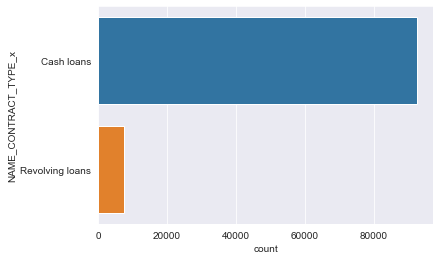

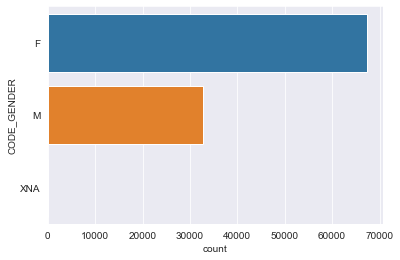

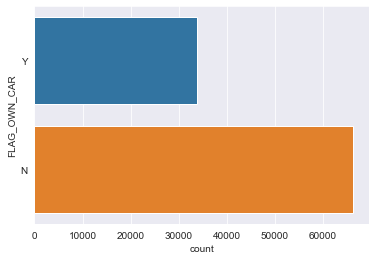

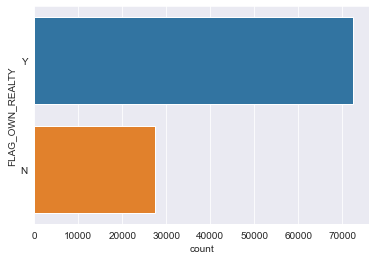

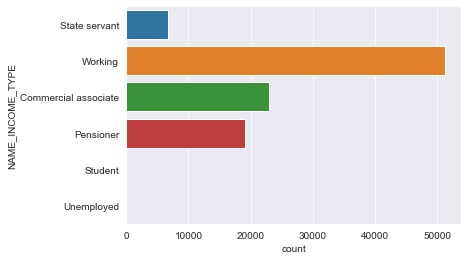

...

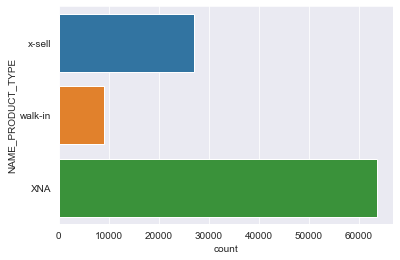

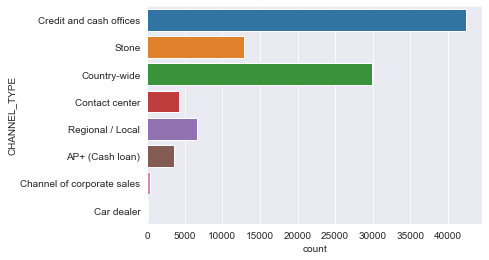

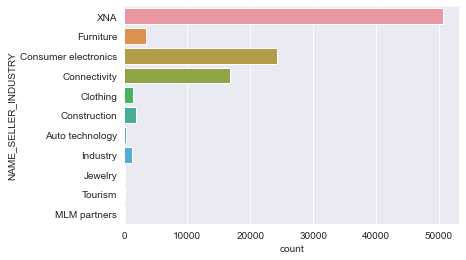

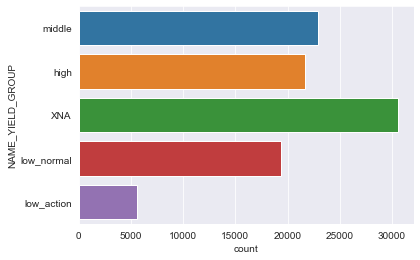

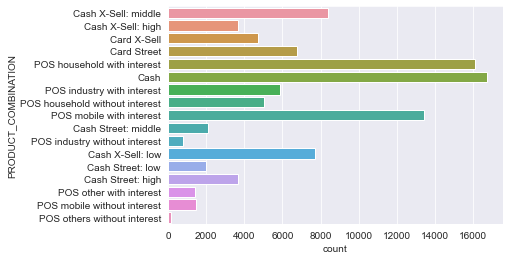

In [20]:
for i in cat.columns:
    plt.figure()
    sns.countplot(data=df, y=i)

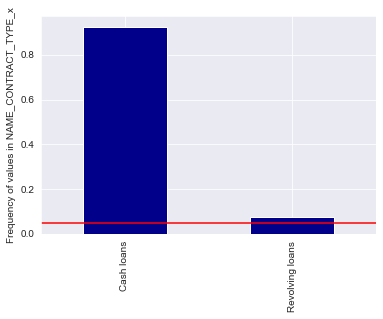

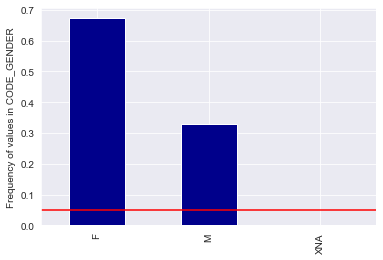

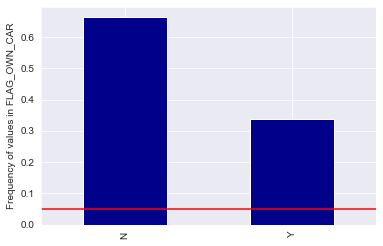

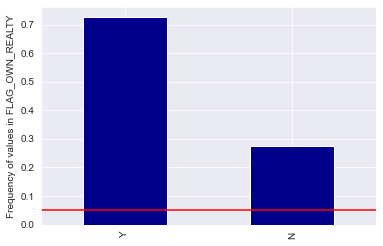

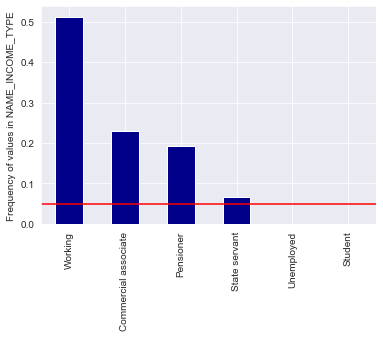

...

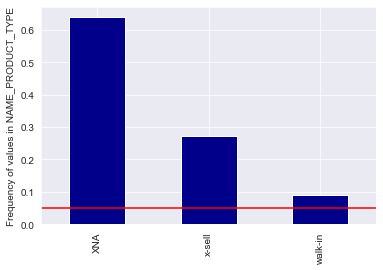

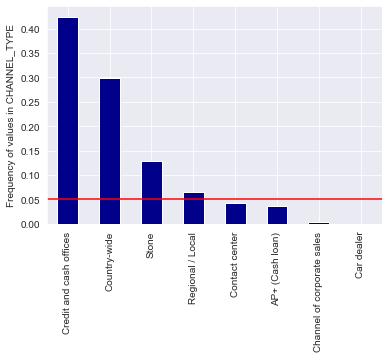

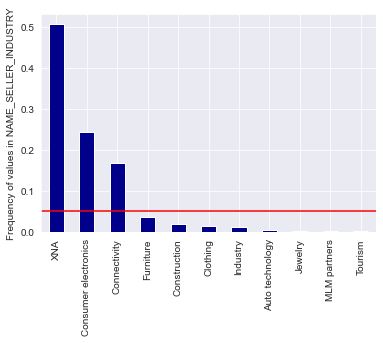

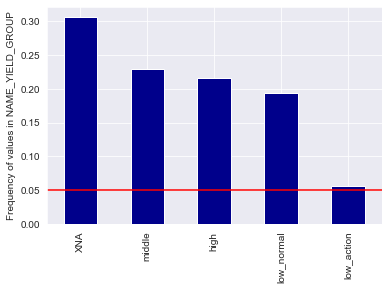

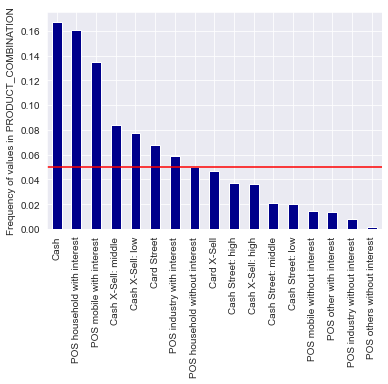

In [21]:
#identifying low cardinality values
for i in cat.columns:
    plt.figure()
    df[i].value_counts(normalize=True).plot.bar(color='darkblue')
    plt.axhline(0.05, color='red')
    plt.ylabel(f'Frequency of values in {i}')

## UNIVARIATE ANALYSIS AND DISTRIBUTION OF NUMERICAL DATA

In [17]:
num = df.select_dtypes('number').iloc[:,1:]

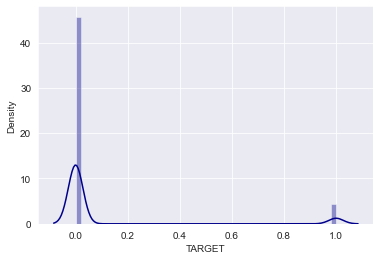

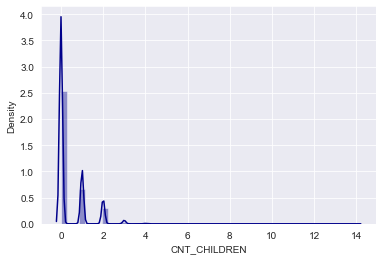

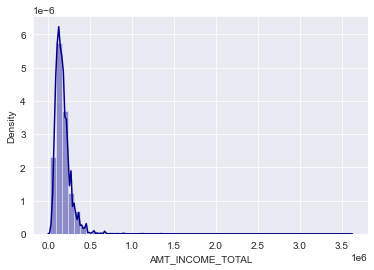

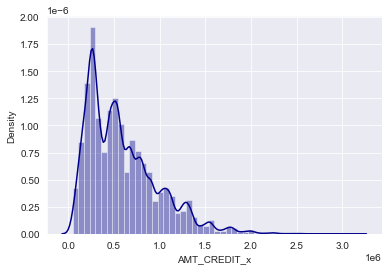

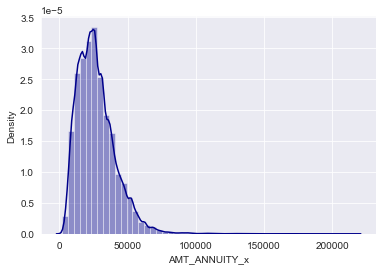

...

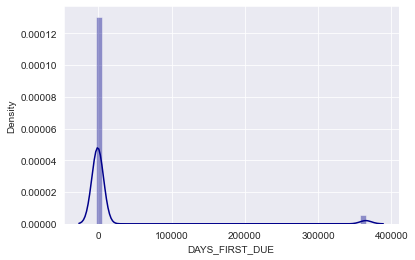

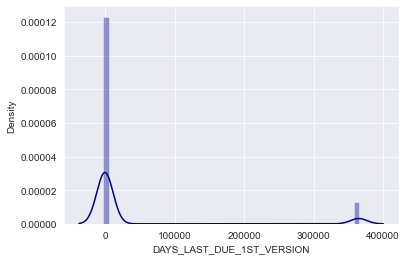

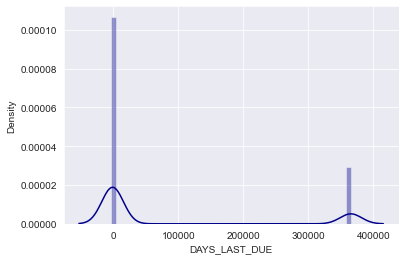

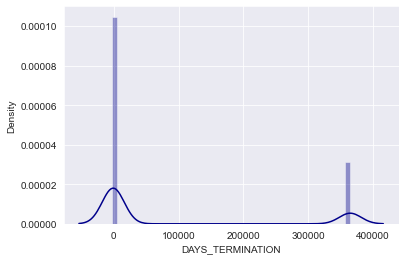

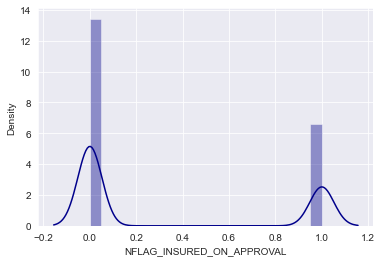

In [23]:
for i in num.columns:
    plt.figure()
    sns.distplot(df[i], color='darkblue')

## BIVARIATE ANALYSIS: RELATIONSHIP WITH TARGET VARIABLE

### NUMERICAL

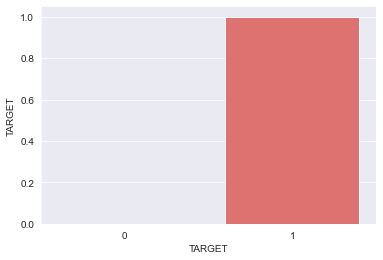

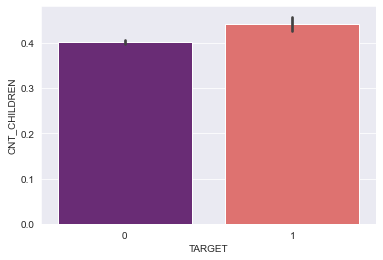

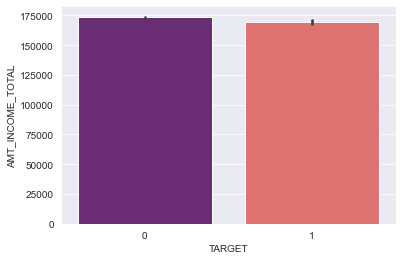

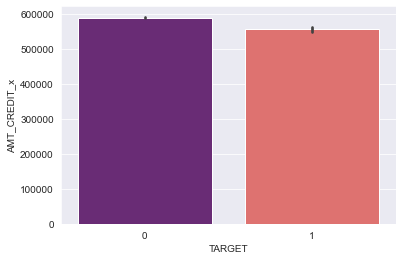

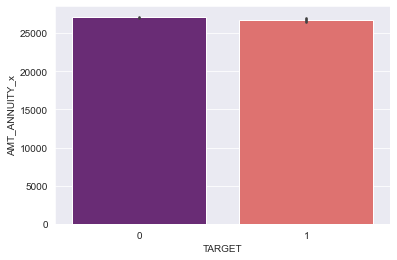

...

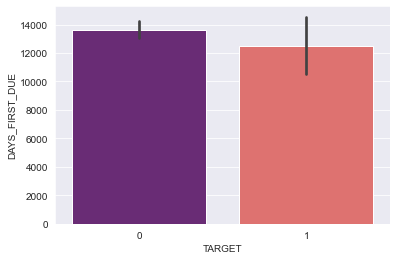

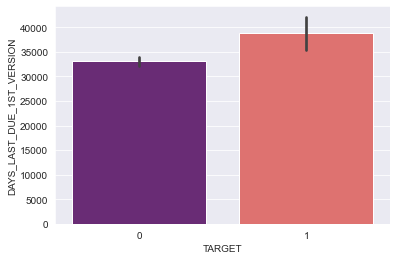

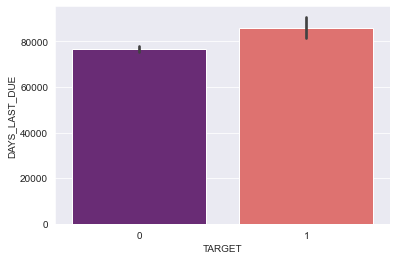

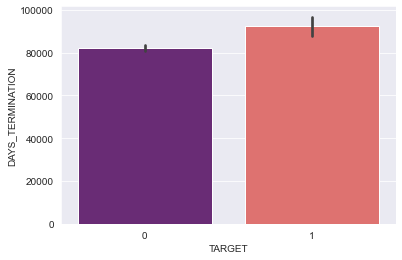

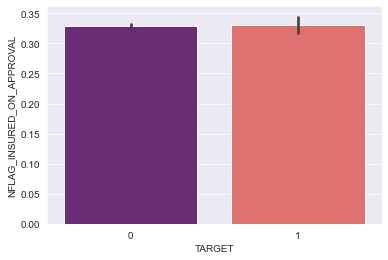

In [24]:
for i in num.columns:
    plt.figure()
    sns.barplot(data=df, x='TARGET', y=i, palette='magma')

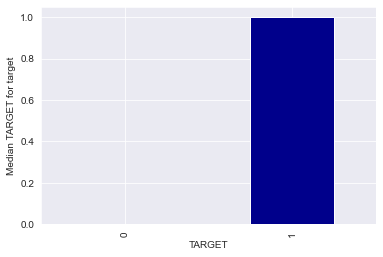

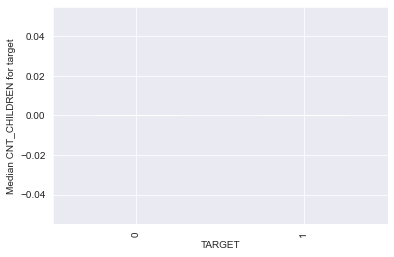

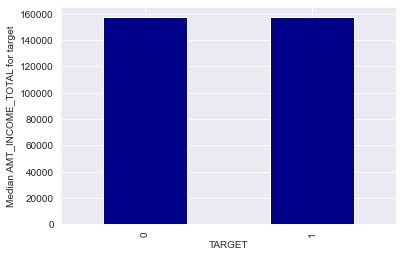

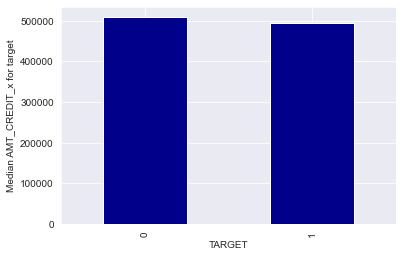

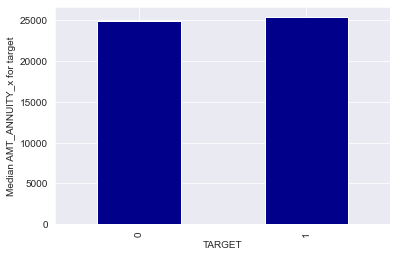

...

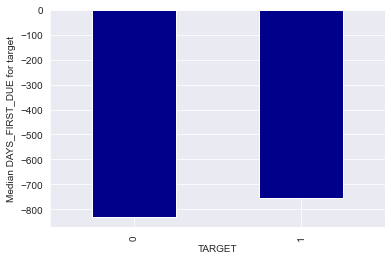

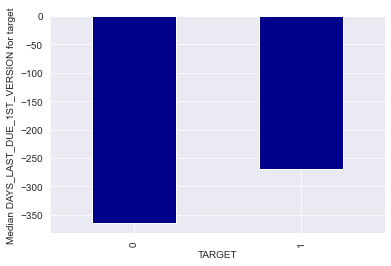

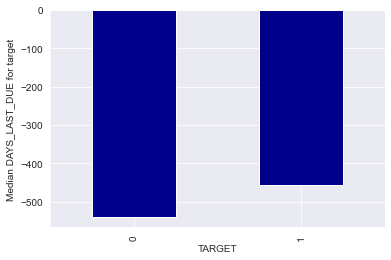

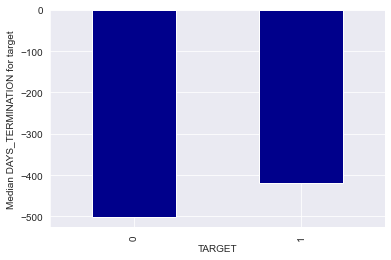

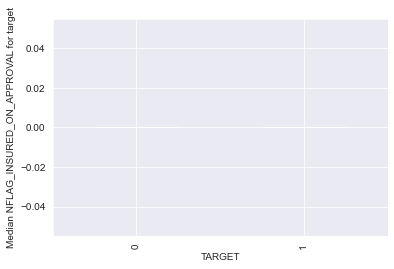

In [25]:
for i in num.columns:
    plt.figure()
    df.groupby('TARGET')[i].median().plot.bar(color='darkblue')
    plt.ylabel(f'Median {i} for target')

In [39]:
df.groupby('TARGET').median()

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_x,AMT_ANNUITY_x,AMT_GOODS_PRICE_x,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_CONT_MOBILE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START_x,REG_REGION_NOT_LIVE_REGION,REG_CITY_NOT_LIVE_CITY,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,Number_of_documents_submitted,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,AMT_APPLICATION,AMT_DOWN_PAYMENT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
TARGET,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,280044.0,0.0,157500.0,508500.0,24939.00,450000.0,0.018850,-16102.0,-1301.0,-4537.0,-3366.0,9.0,1.0,0.0,2.0,2.0,12.0,0.0,0.0,0.0,0.0,0.0,0.0,-1036.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,71955.0,1750.5,1.0,0.060505,0.189122,0.835095,-596.0,4.0,12.0,365243.0,-830.0,-364.0,-539.0,-501.0,0.0
1,278267.0,0.0,157500.0,495000.0,25409.25,450000.0,0.018801,-14844.0,-1109.0,-4056.0,-2846.5,11.0,1.0,0.0,2.0,2.0,12.0,0.0,0.0,1.0,0.0,0.0,0.0,-760.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,62955.0,0.0,1.0,0.000000,0.189122,0.835095,-482.0,0.0,12.0,365243.0,-753.0,-270.0,-455.0,-419.0,0.0


### CATEGORICAL

In [43]:
for i in cat.columns:
    print(pd.crosstab(df[i], df['TARGET']))
    print()

TARGET                    0     1
NAME_CONTRACT_TYPE_x             
Cash loans            84347  8209
Revolving loans       7037   407 

TARGET           0     1
CODE_GENDER             
F            62094  5162
M            29288  3454
XNA          2      0   

TARGET            0     1
FLAG_OWN_CAR             
N             60246  6022
Y             31138  2594

TARGET               0     1
FLAG_OWN_REALTY             
N                25028  2473
Y                66356  6143

TARGET                    0     1
NAME_INCOME_TYPE                 
Commercial associate  21087  1890
Pensioner             17972  1151
State servant         6254   409 
Student               1      0   
Unemployed            5      5   
Working               46065  5161

TARGET                             0     1
NAME_EDUCATION_TYPE                       
Academic degree                34     0   
Higher education               20867  1338
Incomplete higher              2978   261 
Lower secondary            

TARGET              0     1
NAME_PORTFOLIO             
Cards           7836   836 
Cars            19     2   
Cash            25145  2416
POS             38672  3194
XNA             19712  2168

TARGET                 0     1
NAME_PRODUCT_TYPE             
XNA                58403  5364
walk-in            7925   1152
x-sell             25056  2100

TARGET                          0     1
CHANNEL_TYPE                           
AP+ (Cash loan)             3077   464 
Car dealer                  23     2   
Channel of corporate sales  336    32  
Contact center              3810   416 
Country-wide                27455  2463
Credit and cash offices     38623  3832
Regional / Local            6096   465 
Stone                       11964  942 

TARGET                    0     1
NAME_SELLER_INDUSTRY             
Auto technology       260    34  
Clothing              1299   100 
Connectivity          15286  1509
Construction          1690   108 
Consumer electronics  22431  1821
Furnitur

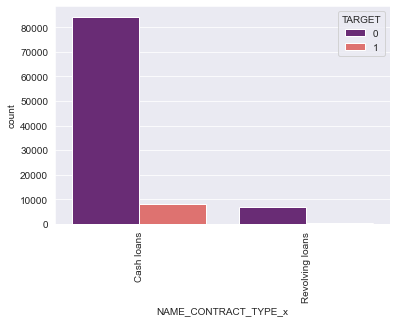

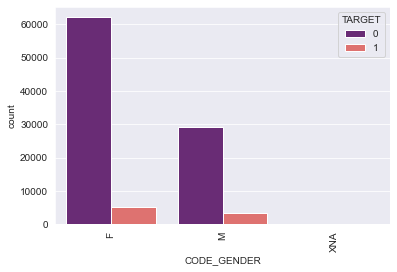

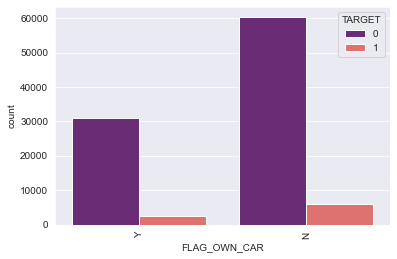

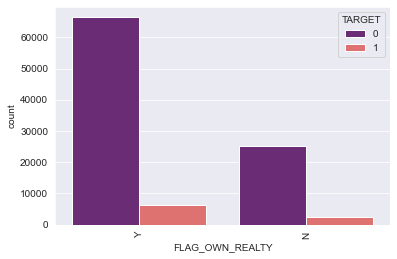

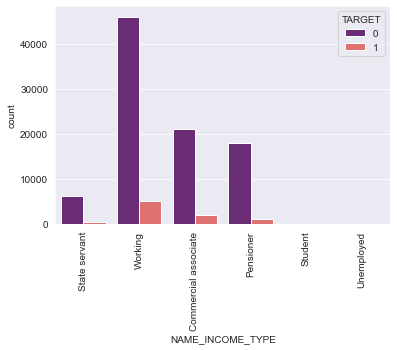

...

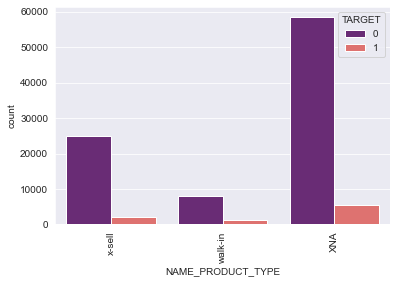

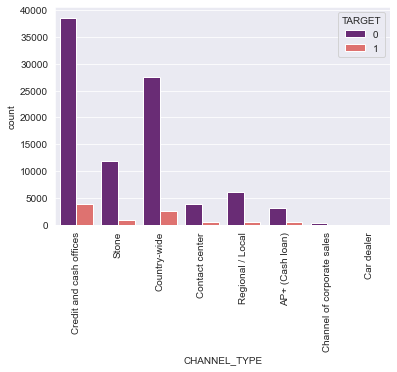

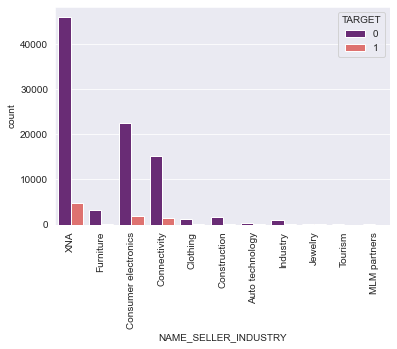

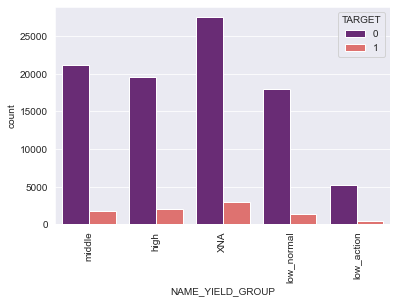

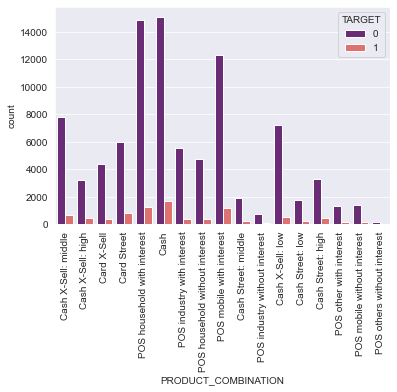

In [44]:
for i in cat.columns:
    plt.figure()
    sns.countplot(data = df, x = i, hue ='TARGET', palette = 'magma')
    plt.xticks(rotation=90)

## LINEAR SEPARABILITY

In [19]:
subset = df[['AMT_INCOME_TOTAL', 'AMT_CREDIT_x',
             'AMT_ANNUITY_x', 'AMT_GOODS_PRICE_x', 'REGION_POPULATION_RELATIVE',
             'DAYS_BIRTH', 'AMT_APPLICATION', 'AMT_DOWN_PAYMENT', 'NFLAG_LAST_APPL_IN_DAY',
             'RATE_DOWN_PAYMENT','TARGET']]

<Figure size 3600x3600 with 0 Axes>

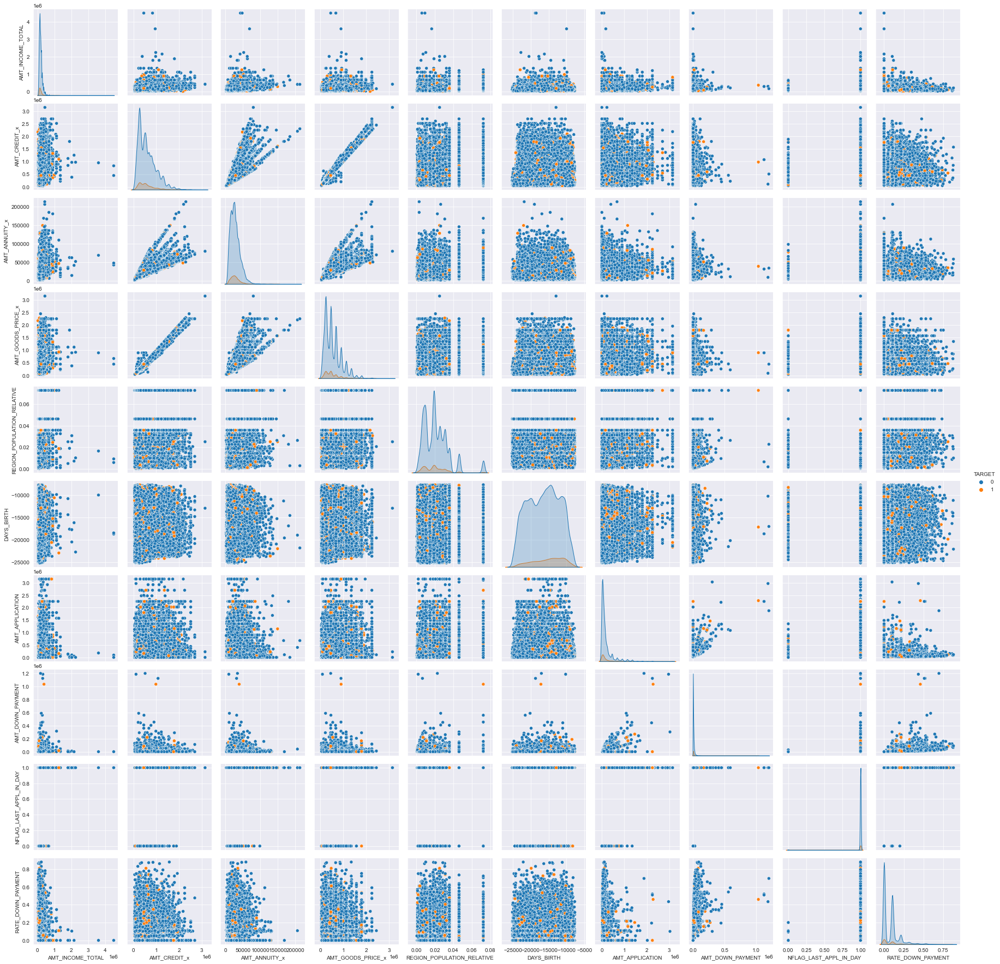

In [20]:
plt.figure(figsize=(50,50))
sns.pairplot(data=subset, hue = 'TARGET', diag_kind='kde')

## CORRELATION

<AxesSubplot:>

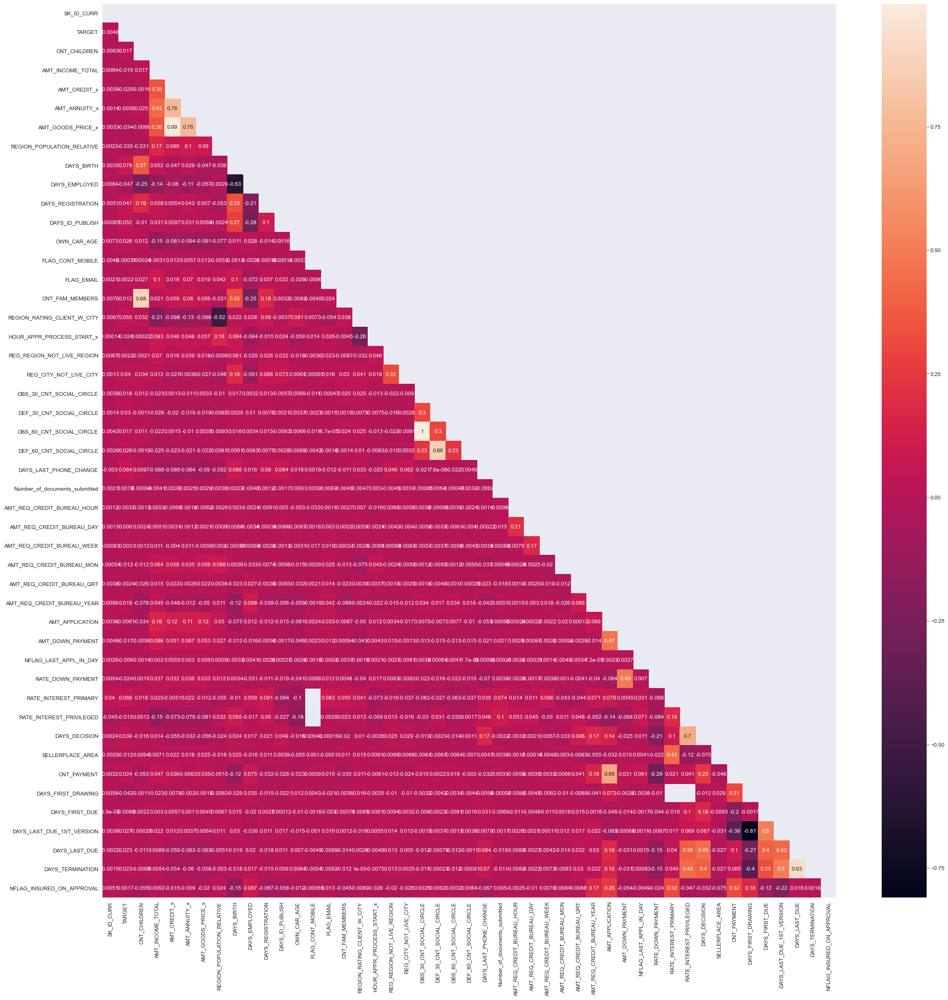

In [24]:
plt.figure(figsize=(30,30))
sns.heatmap(df.corr(method='pearson'), mask = np.triu(df.corr(method='pearson')), annot=True,)

<AxesSubplot:>

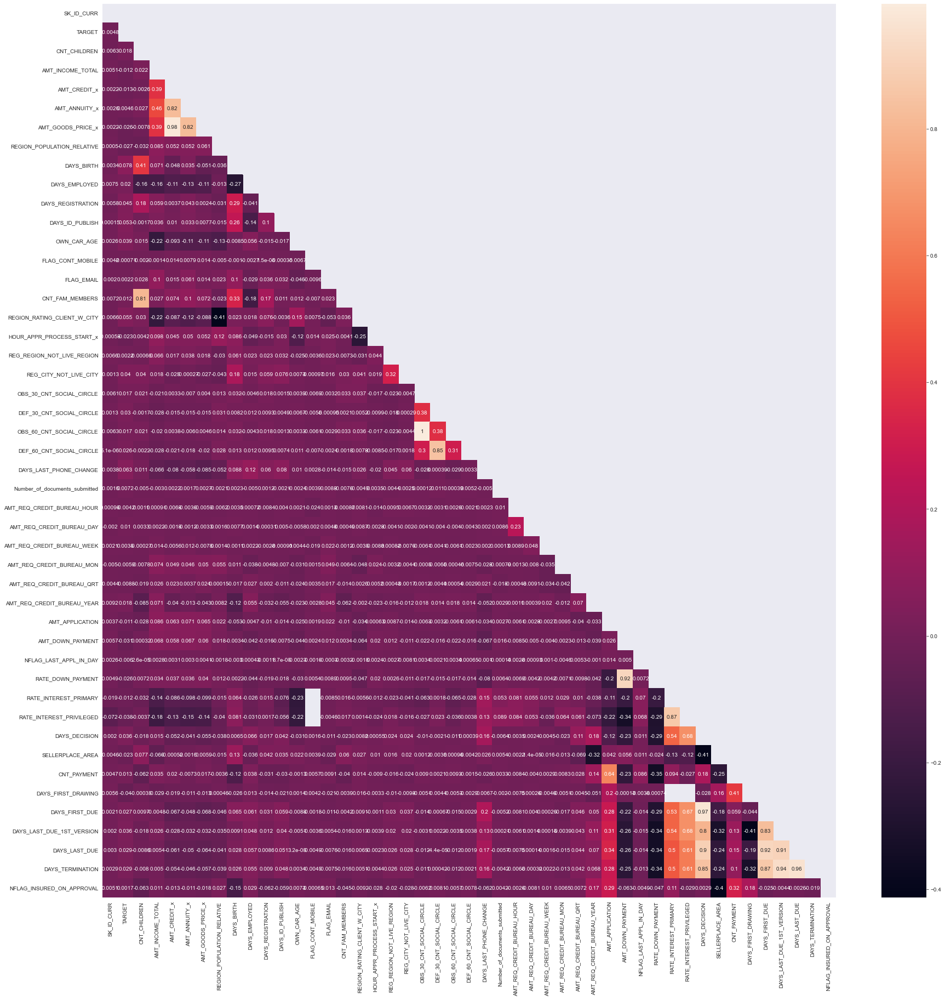

In [25]:
plt.figure(figsize=(30,30))
sns.heatmap(df.corr(method='spearman'), mask = np.triu(df.corr(method='spearman')), annot=True,)

## NORMALITY

###### --- WITH SHAPIRO-WILK

In [29]:
for i in num.columns:
    pvalue = scipy.stats.shapiro(df[i])[1]
    print(i.upper())
    if pvalue<0.05:
        print('Data is not normal')
    else:
        print('Data is normal')
    print()

TARGET
Data is not normal

CNT_CHILDREN
Data is not normal

AMT_INCOME_TOTAL
Data is not normal

AMT_CREDIT_X
Data is not normal

AMT_ANNUITY_X
Data is normal

AMT_GOODS_PRICE_X
Data is normal

REGION_POPULATION_RELATIVE
Data is not normal

DAYS_BIRTH
Data is not normal

DAYS_EMPLOYED
Data is not normal

DAYS_REGISTRATION
Data is not normal

DAYS_ID_PUBLISH
Data is not normal

OWN_CAR_AGE
Data is normal

FLAG_CONT_MOBILE
Data is not normal

FLAG_EMAIL
Data is not normal

CNT_FAM_MEMBERS
Data is not normal

REGION_RATING_CLIENT_W_CITY
Data is not normal

HOUR_APPR_PROCESS_START_X
Data is not normal

REG_REGION_NOT_LIVE_REGION
Data is not normal

REG_CITY_NOT_LIVE_CITY
Data is not normal

OBS_30_CNT_SOCIAL_CIRCLE
Data is normal

DEF_30_CNT_SOCIAL_CIRCLE
Data is normal

OBS_60_CNT_SOCIAL_CIRCLE
Data is normal

DEF_60_CNT_SOCIAL_CIRCLE
Data is normal

DAYS_LAST_PHONE_CHANGE
Data is not normal

NUMBER_OF_DOCUMENTS_SUBMITTED
Data is normal

AMT_REQ_CREDIT_BUREAU_HOUR
Data is normal

AMT_REQ_

###### --- WITH Q-Q AND DISTPLOT

In [32]:
def normality_viz(data, feature):
    plt.figure(figsize=(15,15))
    plt.subplot(121)
    sns.distplot(data[feature], color='darkblue')
    
    plt.subplot(122)
    scipy.stats.probplot(data[feature], dist='norm', plot=plt)

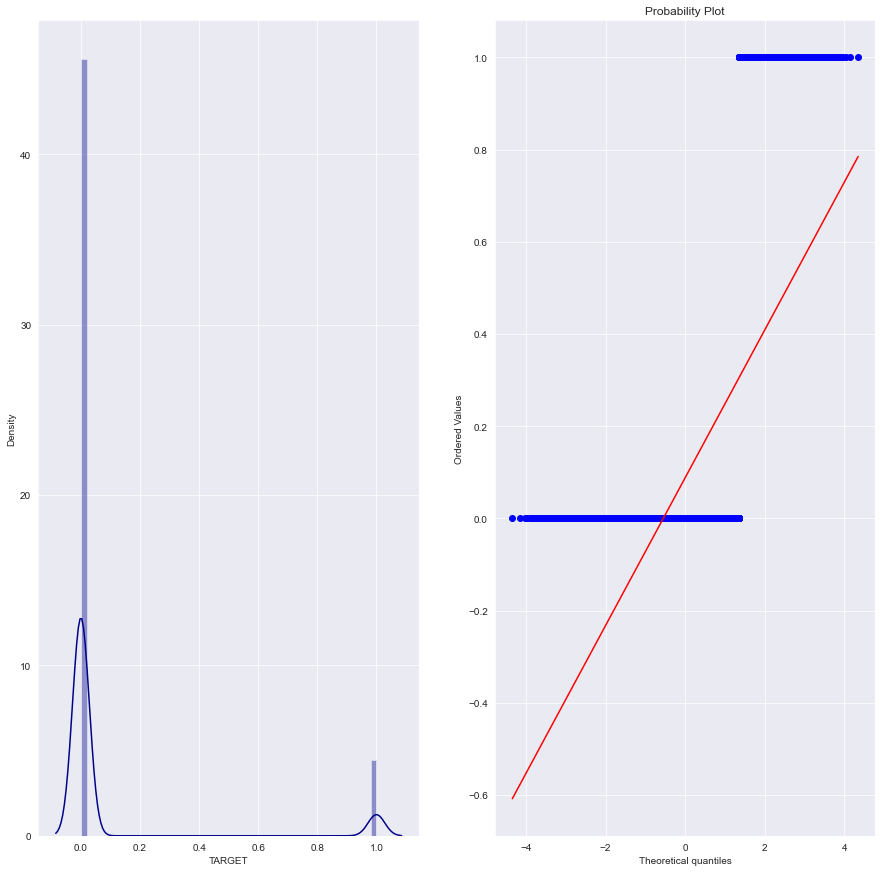

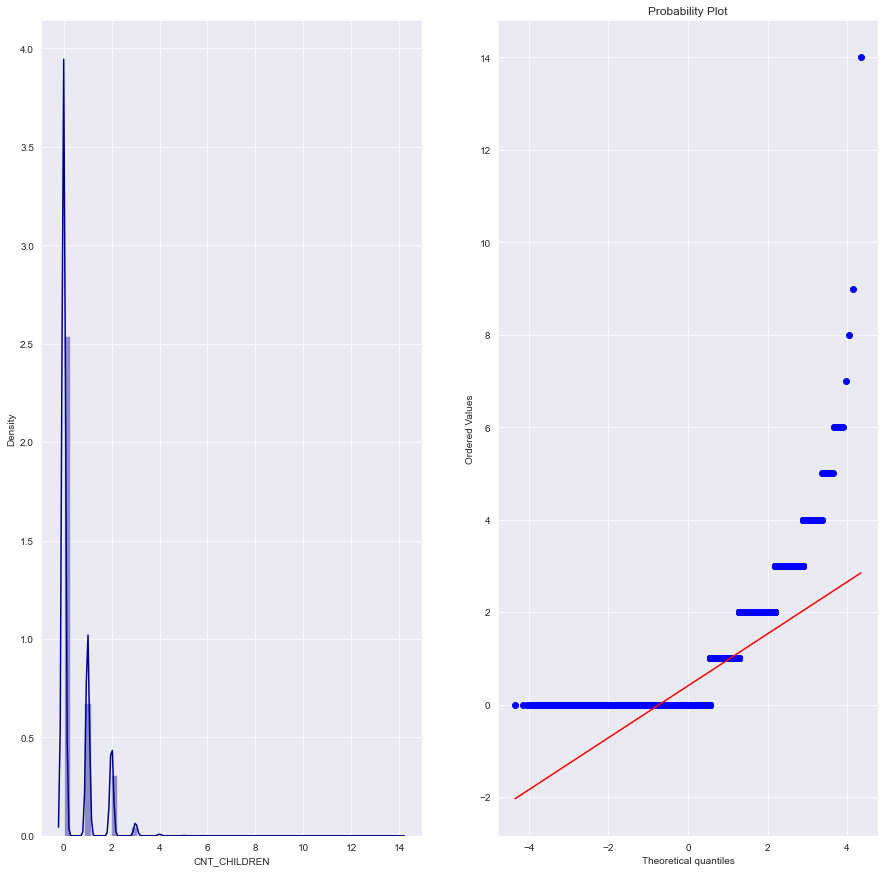

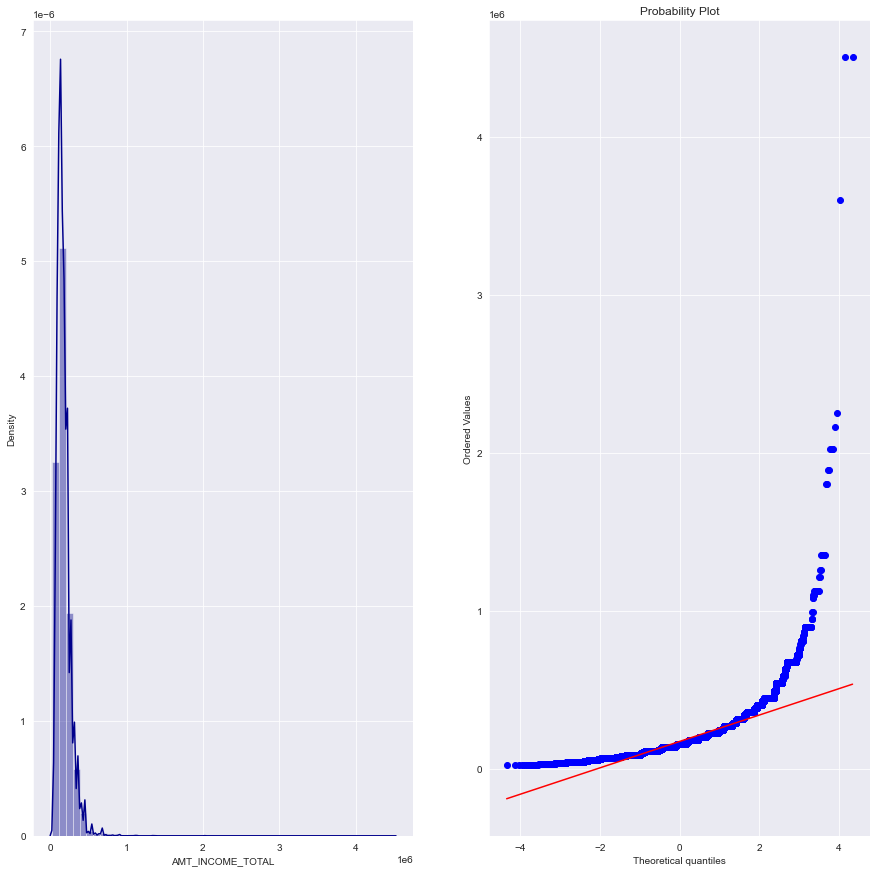

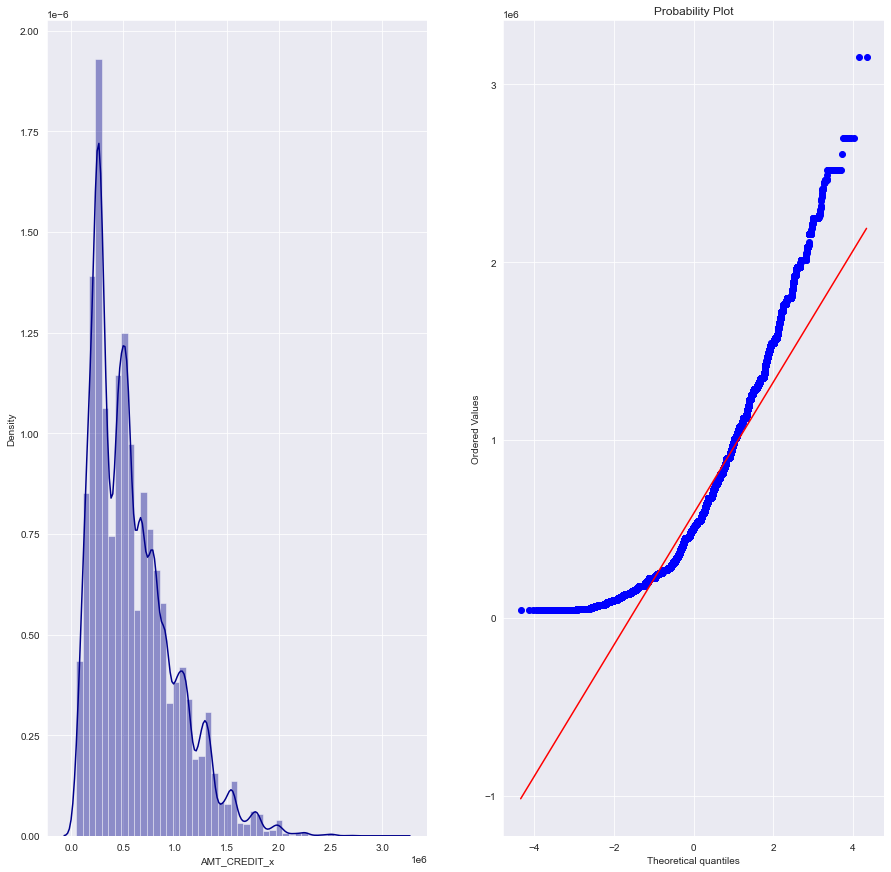

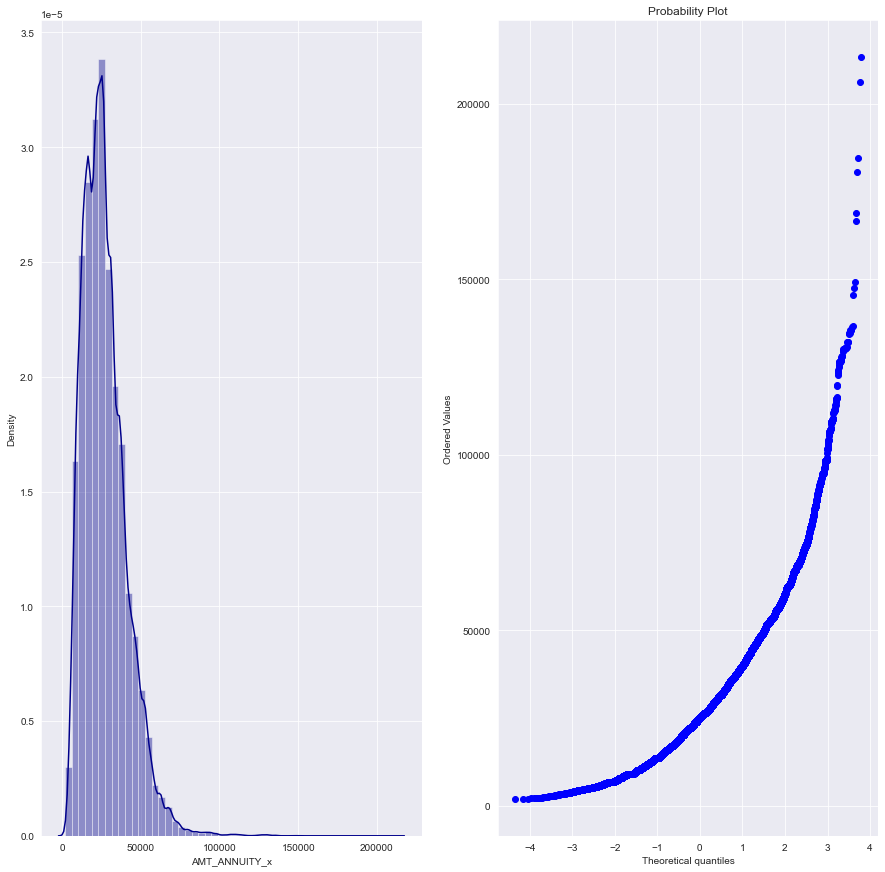

...

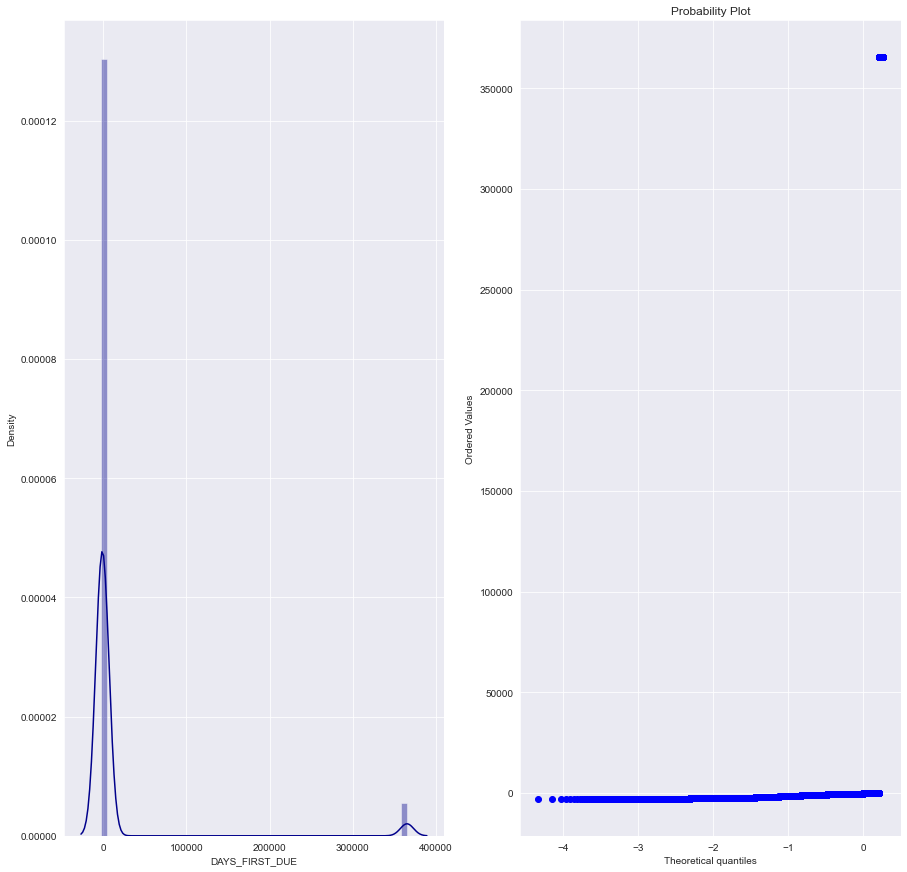

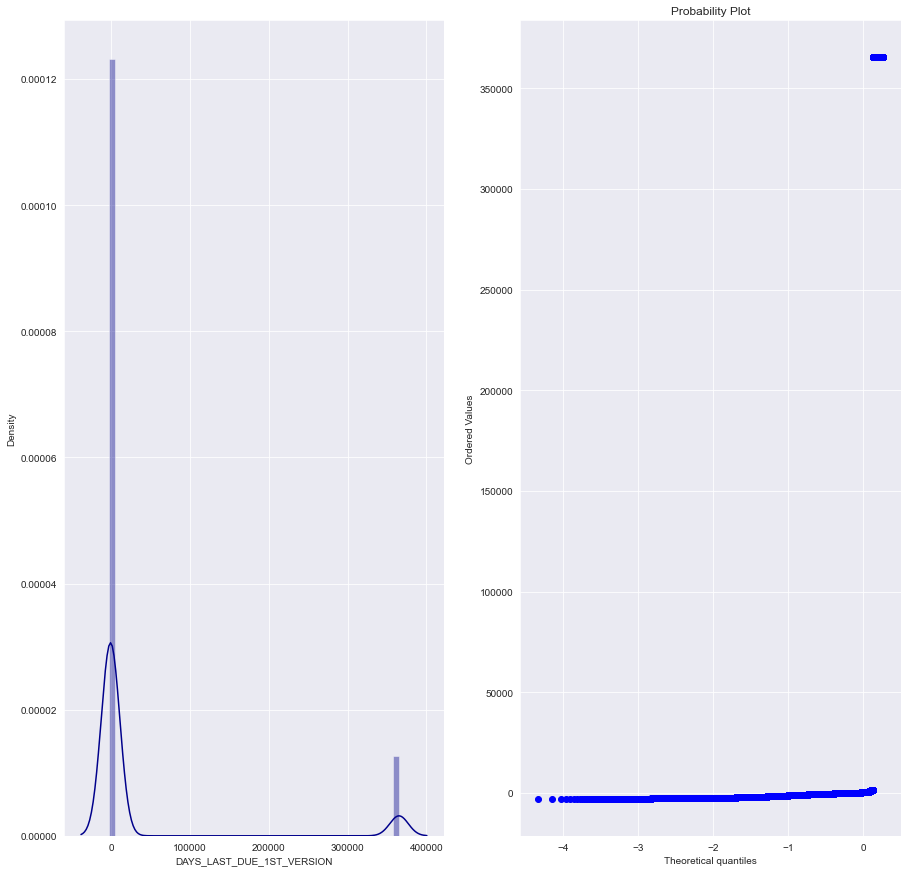

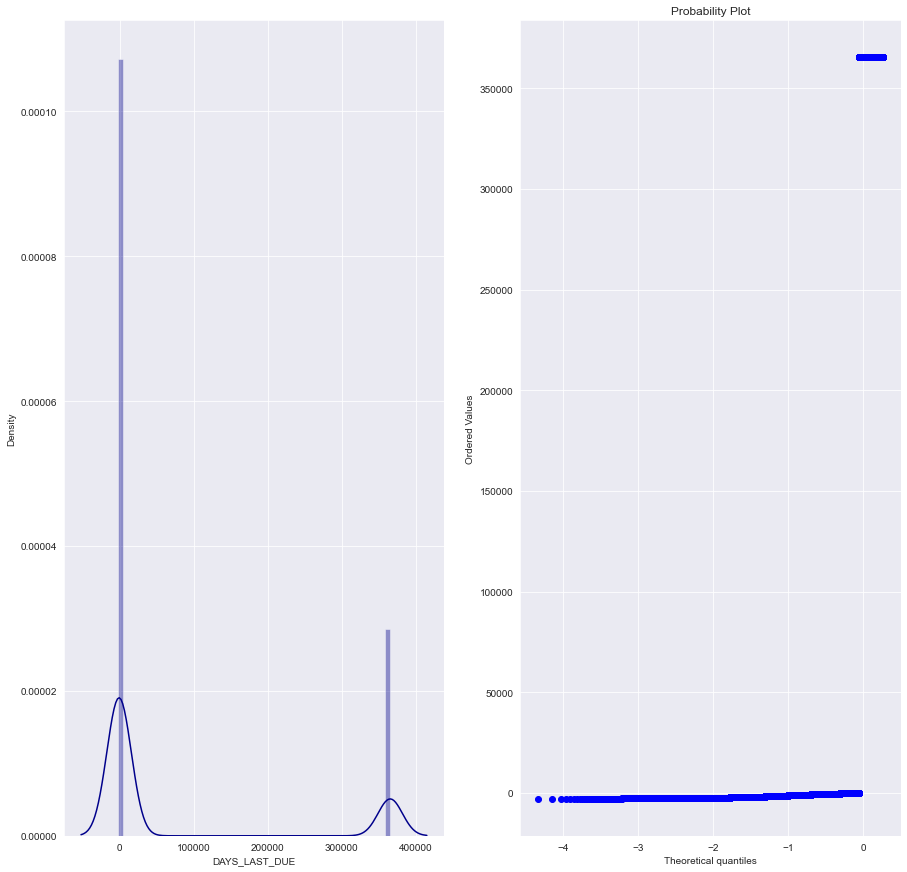

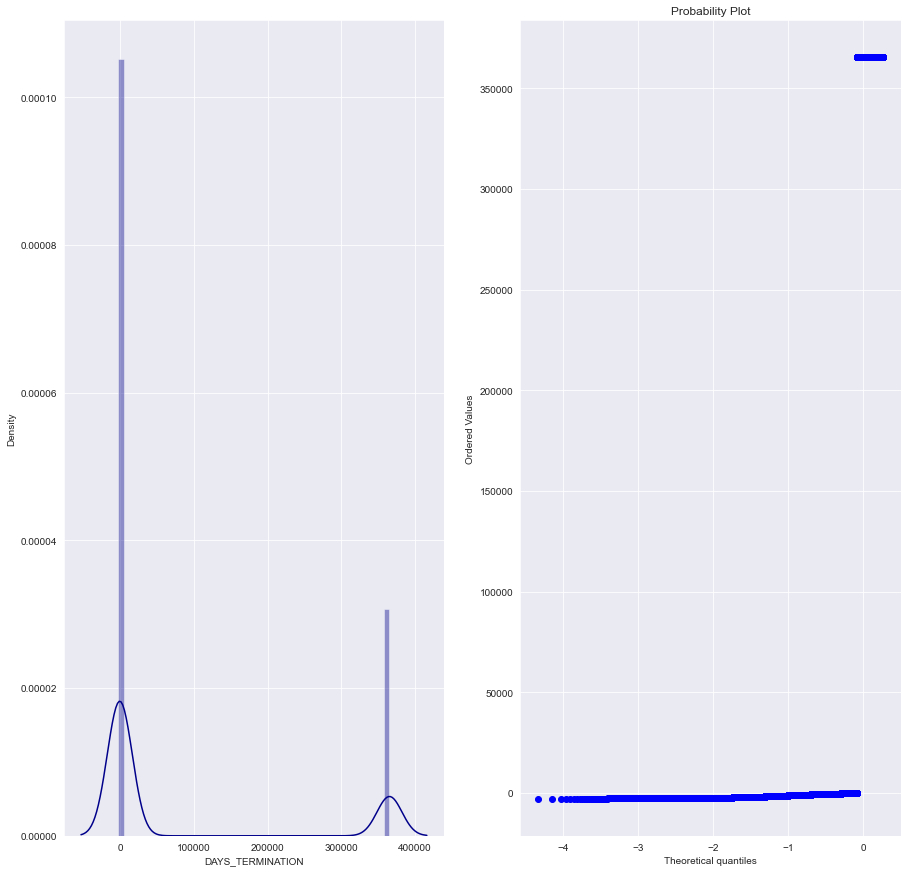

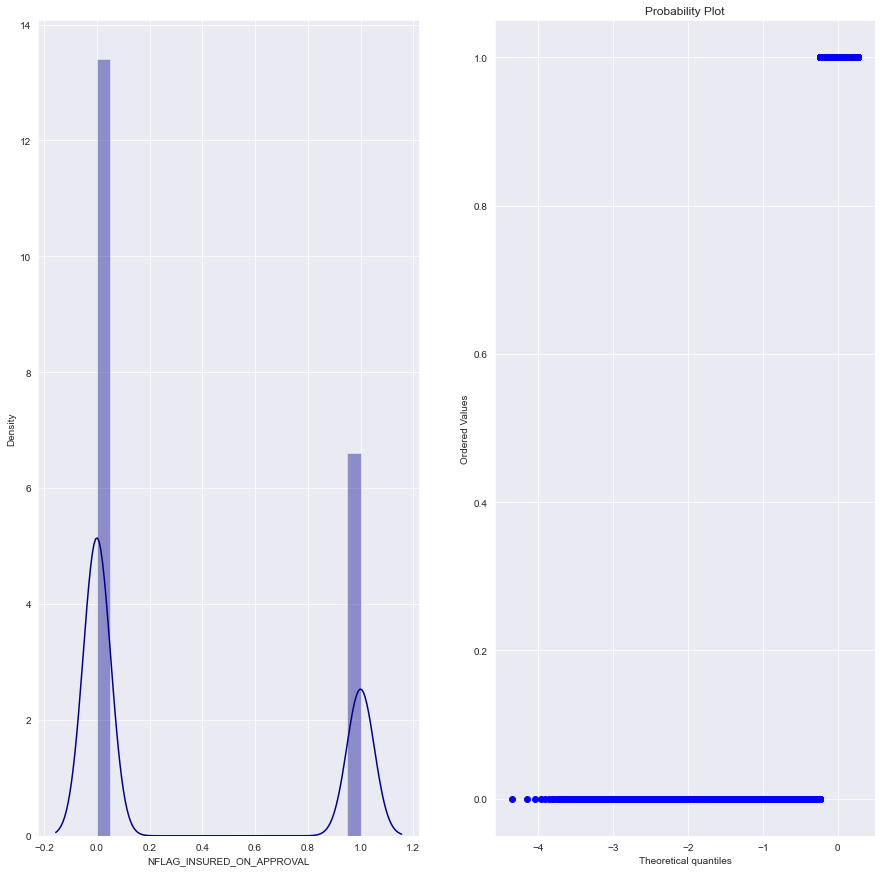

In [33]:
for i in num.columns:
    normality_viz(df, i)

## OUTLIERS

###### --- WITH BOXPLOT

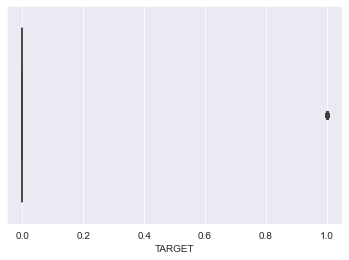

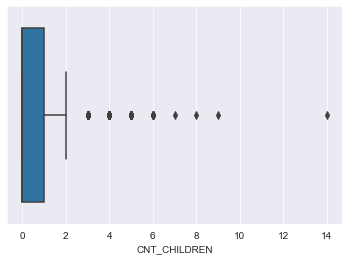

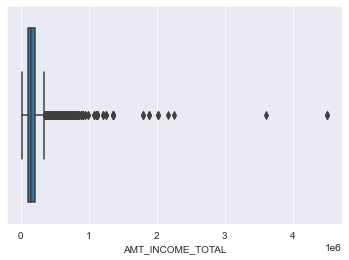

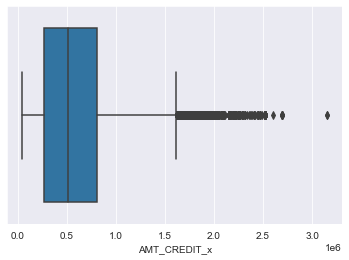

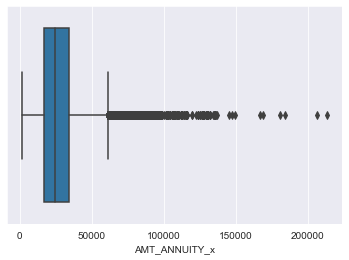

...

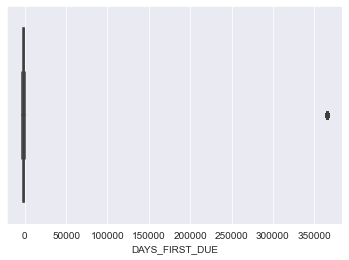

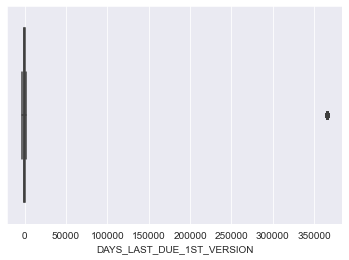

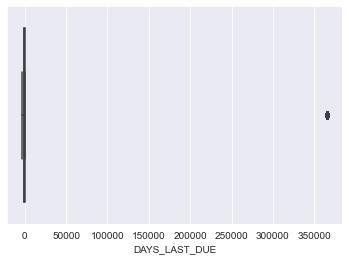

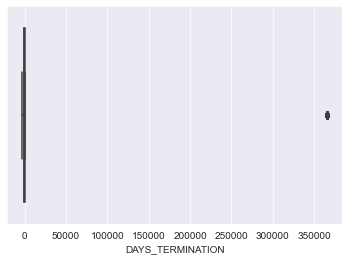

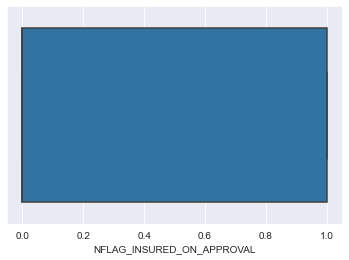

In [34]:
for i in num.columns:
    plt.figure()
    sns.boxplot(data=df, x=i)

###### --- WITH IQR

In [35]:
Q3 = df['AMT_INCOME_TOTAL'].quantile(0.75)
Q1 = df['AMT_INCOME_TOTAL'].quantile(0.25)

IQR = Q3 - Q1

upper_limit = Q3 + 1.5*IQR
lower_limit = Q1 - 1.5*IQR

outliers = np.where(df['AMT_INCOME_TOTAL']>upper_limit, True, np.where(df['AMT_INCOME_TOTAL']<lower_limit, True, False))

len(df.loc[outliers])

4641

## FEATURE RANGE/SCALING

In [36]:
for i in num.columns:
    max_ = df[i].max()
    min_ = df[i].min()
    print(i,f'Range of {i}:', max_ - min_)

TARGET Range of TARGET: 1
CNT_CHILDREN Range of CNT_CHILDREN: 14
AMT_INCOME_TOTAL Range of AMT_INCOME_TOTAL: 4474350.0
AMT_CREDIT_x Range of AMT_CREDIT_x: 3105000.0
AMT_ANNUITY_x Range of AMT_ANNUITY_x: 211167.0
AMT_GOODS_PRICE_x Range of AMT_GOODS_PRICE_x: 3105000.0
REGION_POPULATION_RELATIVE Range of REGION_POPULATION_RELATIVE: 0.072218
DAYS_BIRTH Range of DAYS_BIRTH: 17519
DAYS_EMPLOYED Range of DAYS_EMPLOYED: 382765
DAYS_REGISTRATION Range of DAYS_REGISTRATION: 22858.0
DAYS_ID_PUBLISH Range of DAYS_ID_PUBLISH: 6337
OWN_CAR_AGE Range of OWN_CAR_AGE: 69.0
FLAG_CONT_MOBILE Range of FLAG_CONT_MOBILE: 1
FLAG_EMAIL Range of FLAG_EMAIL: 1
CNT_FAM_MEMBERS Range of CNT_FAM_MEMBERS: 15.0
REGION_RATING_CLIENT_W_CITY Range of REGION_RATING_CLIENT_W_CITY: 2
HOUR_APPR_PROCESS_START_x Range of HOUR_APPR_PROCESS_START_x: 23
REG_REGION_NOT_LIVE_REGION Range of REG_REGION_NOT_LIVE_REGION: 1
REG_CITY_NOT_LIVE_CITY Range of REG_CITY_NOT_LIVE_CITY: 1
OBS_30_CNT_SOCIAL_CIRCLE Range of OBS_30_CNT_SOCIAL_

## DATA CLEANING

### CONVERTING COLUMNS WITH NUMERICAL VALUES TO +VE

In [18]:
# extract columns with negative values
neg = []
for i in num.columns:
    for x in merged_data[i]:
        if x<0:
            if i not in neg:
                neg.append(i)
        else:
            pass

In [19]:
neg

['DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_DOWN_PAYMENT',
 'RATE_DOWN_PAYMENT',
 'DAYS_DECISION',
 'SELLERPLACE_AREA',
 'DAYS_FIRST_DRAWING',
 'DAYS_FIRST_DUE',
 'DAYS_LAST_DUE_1ST_VERSION',
 'DAYS_LAST_DUE',
 'DAYS_TERMINATION']

In [20]:
for i in neg:
    full_train[i] =  np.abs(full_train[i])
    test[i] =  np.abs(test[i])
    reduced_train[i] = np.abs(reduced_train[i])
    validation[i] =  np.abs(validation[i])

In [21]:
#converting DAYS_BIRTH column to age in years
dataset = [full_train, test, reduced_train,validation]
for i in dataset:
    i['DAYS_BIRTH'] = np.round(i['DAYS_BIRTH']/365.25,0)

## Reducing cardinality

In [22]:
others = ['OCCUPATION_TYPE', 'NAME_PAYMENT_TYPE','CODE_REJECT_REASON','NAME_CLIENT_TYPE','NAME_GOODS_CATEGORY',
          'NAME_PORTFOLIO','CHANNEL_TYPE','PRODUCT_COMBINATION']

In [23]:
#by setting items with frequency lower than 0.05 to others
for i in others:
    cardinality = reduced_train[i].value_counts(normalize=True)
    keep = cardinality[cardinality>=0.05].index.tolist()
    
    reduced_train.loc[~reduced_train[i].isin(keep),i] = 'Others'
    full_train.loc[~full_train[i].isin(keep),i] = 'Others'
    validation.loc[~validation[i].isin(keep),i] = 'Others'
    test.loc[~test[i].isin(keep),i] = 'Others'

In [24]:
for i in dataset:
    i.rename(columns={'NAME_INCOME_TYPE':'WORKS_CURRENTLY'}, inplace=True)

In [25]:
for i in dataset:
    i['WORKS_CURRENTLY'].replace({'Working':'Yes',
                                  'Pensioner':'No',
                                  'State servant':'Yes',
                                  'Commercial associate':'Yes',
                                  'Unemployed':'No',
                                  'Student':'No',
                                  'Maternity leave':'No'}, inplace=True)

In [26]:
for i in dataset:
    i.rename(columns={'NAME_FAMILY_STATUS':'MARITAL_STATUS'}, inplace=True)

In [27]:
for i in dataset:
    i['MARITAL_STATUS'].replace({'Single / not married':'Single',
                                  'Separated':'Single',
                                  'Civil marriage':'Married',
                                  'Widow':'Single'}, inplace=True)

In [28]:
for i in dataset:
    i.rename(columns={'NAME_TYPE_SUITE_x':'COMPANY'}, inplace=True)

In [29]:
for i in dataset:
    i['COMPANY']=np.where(i['COMPANY']=='Unaccompanied', 'Unaccompanied', 'Accompanied') 

In [30]:
#label Encoding of binary columns
label_enco = ['CODE_GENDER', 'FLAG_OWN_CAR','FLAG_OWN_REALTY','FLAG_LAST_APPL_PER_CONTRACT','WORKS_CURRENTLY',
              'MARITAL_STATUS','COMPANY']

In [31]:
le = LabelEncoder()

In [32]:
for i in label_enco:
    full_train[i] = le.fit_transform(full_train[i])
    reduced_train[i] = le.transform(reduced_train[i])
    validation[i] = le.transform(validation[i])
    test[i] = le.transform(test[i])

## SPLITTING

In [33]:
xtrain_full, ytrain_full = full_train.drop(['TARGET'], axis=1), full_train['TARGET']
xtrain, ytrain = reduced_train.drop(['TARGET'], axis=1), reduced_train['TARGET']
xtrain_val, ytrain_val = validation.drop(['TARGET'], axis=1), validation['TARGET']
xtest, ytest = test.drop(['TARGET'], axis=1), test['TARGET']
xtrain_full.shape, ytrain_full.shape, xtrain.shape, ytrain.shape,xtrain_val.shape, ytrain_val.shape,xtest.shape, ytest.shape

((320000, 71),
 (320000,),
 (192000, 71),
 (192000,),
 (128000, 71),
 (128000,),
 (80000, 71),
 (80000,))

## DEALING WITH CLASS IMBALANCE

In [30]:
full_train['TARGET'].value_counts()

0    292364
1     27636
Name: TARGET, dtype: int64

## EXPERIMENT 0
 - NULL VALUES: MEDIAN/MODE IMPUTATION
 - TRANSFORMATION: LOG
 - SCALING: STANDARD SCALING
 - ENCODING: ONE HOT ENCODER
 - IMBALANCE: ADASYN
 
 
 
 
 ### USING ADASYN 
(Adaptive Synthetic Sampling): ADASYN is an extension of SMOTE that generates more synthetic examples for the minority class in regions where it is more difficult to learn from existing examples. It can be useful when the decision boundary between classes is complex.

In [34]:
xtrain_0 = xtrain.copy()
ytrain_0 = ytrain.copy()

In [35]:
xtrain_0 = xtrain_0.drop(['SK_ID_CURR'], axis=1)

In [36]:
num = xtrain_0.select_dtypes('number').columns
cat = xtrain_0.select_dtypes('O').columns

In [37]:
#median/mode imputation
median_imputer = SimpleImputer(strategy='median')
mode_imputer = SimpleImputer(strategy='most_frequent')

In [38]:
xtrain_0[num] = median_imputer.fit_transform(xtrain_0[num])

In [39]:
xtrain_0[cat] = mode_imputer.fit_transform(xtrain_0[cat])

In [40]:
#log transformation
log_transformer = FunctionTransformer(np.log1p)

xtrain_0[num] = log_transformer.transform(xtrain_0[num])

In [41]:
#standard scaling
scaler = StandardScaler()
xtrain_0[num] = scaler.fit_transform(xtrain_0[num])

In [42]:
#one hot encoding
xtrain_0 = pd.get_dummies(xtrain_0)

In [43]:
#adasyn
from imblearn.over_sampling import ADASYN
adasyn = ADASYN()

In [44]:
x_train_0_s, ytrain_0_s = adasyn.fit_resample(xtrain_0, ytrain_0 )

In [45]:
ytrain_0.shape, xtrain_0.shape

((192000,), (192000, 220))

## MODEL BUILDING

In [46]:
def classification_model_0(model):
    precision = cross_val_score(model, x_train_0_s, ytrain_0_s, cv=3, scoring = 'precision').mean()
    recall = cross_val_score(model, x_train_0_s, ytrain_0_s, cv=3, scoring = 'recall').mean()
    f1_score = cross_val_score(model, x_train_0_s, ytrain_0_s, cv=3, scoring = 'f1').mean()
    ypred = cross_val_predict(model, x_train_0_s, ytrain_0_s, cv=3, )
    
    metrics_table = pd.DataFrame({'Precision':precision,
                                 'Recall':recall,
                                 'f1_Score':f1_score,
                                 }, index = [0])
    #plt.subplots(121)
    sns.heatmap(confusion_matrix(ytrain_0_s, ypred,), annot=True)
    plt.xlabel('Predicted');plt.ylabel('Actual');plt.show()
    
    auc_score = roc_auc_score(ytrain_0_s, ypred)
    model.fit(x_train_0_s, ytrain_0_s)
   # plt.subplots(122)
    fpr, tpr, threshs  = roc_curve(ytrain_0_s, model.predict_proba(x_train_0_s)[:,1])
    plt.plot(fpr, tpr, label = 'AUC_SCORE(area=%0.2f)'%auc_score)
    plt.legend()
    plt.plot([0,1],[0,1],'r--')

    plt.xlabel('False Positive Rate');plt.ylabel('True Positive Rate')
    plt.title('ROC curve');plt.show()
    
    return metrics_table 

## DECISION TREE

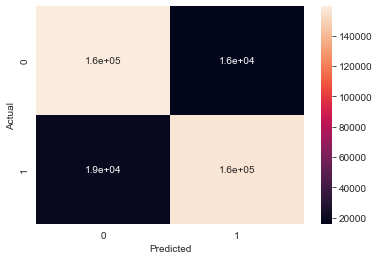

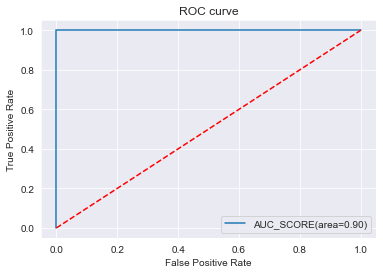

In [47]:
tree_0 = DecisionTreeClassifier()

metrics_table_0a = classification_model_0(tree_0)

In [48]:
metrics_table_0a.index = ['Decision_Tree_0']
metrics_table_0a

,Precision,Recall,f1_Score
Decision_Tree_0,0.910693,0.893117,0.897372


## RANDOM FOREST

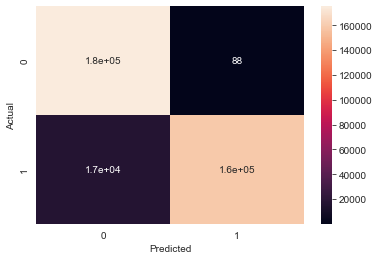

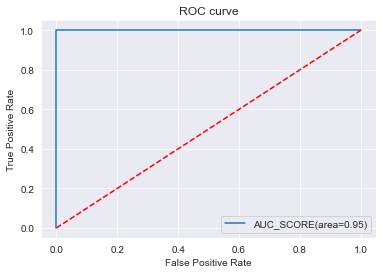

In [49]:
forest_0 = RandomForestClassifier()

metrics_table_0b = classification_model_0(forest_0)

In [50]:
metrics_table_0b.index = ['Random_forest_0']
metrics_table_0b

,Precision,Recall,f1_Score
Random_forest_0,0.999515,0.905023,0.945757


## EXTRA TREES

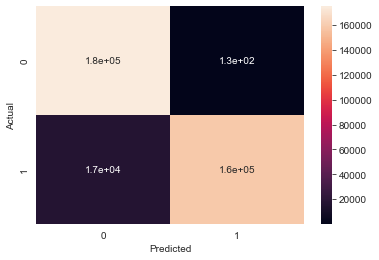

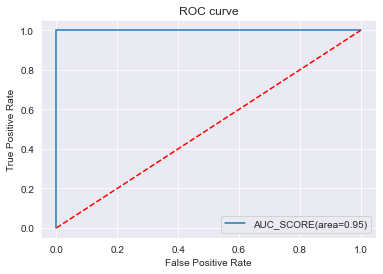

In [51]:
ext_0 = ExtraTreesClassifier()

metrics_table_0c = classification_model_0(ext_0)

In [52]:
metrics_table_0c.index = ['Extra_Trees_0']
metrics_table_0c

,Precision,Recall,f1_Score
Extra_Trees_0,0.999026,0.905616,0.945027


## KNN

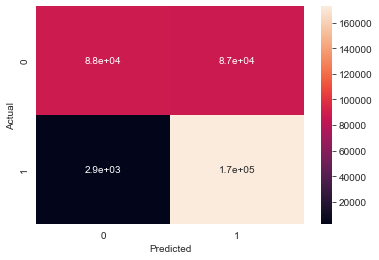

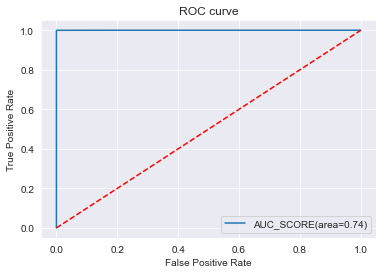

In [53]:
knn_0 = KNeighborsClassifier()

metrics_table_0d = classification_model_0(knn_0)

In [54]:
metrics_table_0d.index = ['KNN_0']
metrics_table_0d

,Precision,Recall,f1_Score
KNN_0,0.663827,0.983718,0.792713


## LOGISTIC REGRESSION

<IPython.core.display.Javascript object>

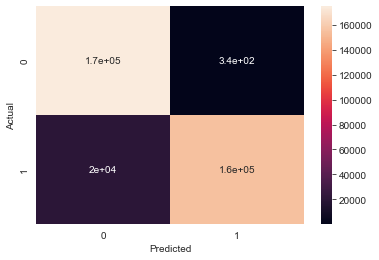

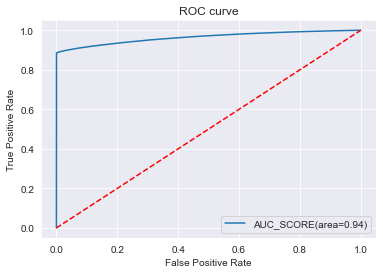

In [55]:
log_0 = LogisticRegression()

metrics_table_0e = classification_model_0(log_0)

In [56]:
metrics_table_0e.index = ['Logistic_Reg_0']
metrics_table_0e

,Precision,Recall,f1_Score
Logistic_Reg_0,0.998021,0.884075,0.931961


## XGBOOST

In [58]:
import xgboost

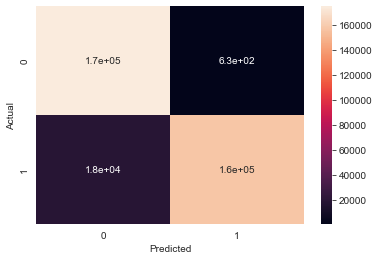

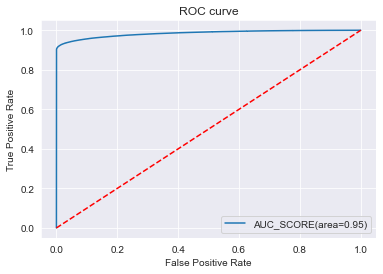

In [59]:
xgb_0 = xgboost.XGBClassifier()

metrics_table_0f = classification_model_0(xgb_0)

In [60]:
metrics_table_0f.index = ['Xgboost_0']
metrics_table_0f

,Precision,Recall,f1_Score
Xgboost_0,0.996392,0.894632,0.937014


In [61]:
metrics_0 = pd.concat([metrics_table_0a,metrics_table_0b,metrics_table_0c,metrics_table_0d,metrics_table_0e,
                       metrics_table_0f])

In [80]:
metrics_0.sort_values(by=['f1_Score'], ascending=[False,])

,Precision,Recall,f1_Score
Random_forest_0,0.999515,0.905023,0.945757
Extra_Trees_0,0.999026,0.905616,0.945027
Xgboost_0,0.996392,0.894632,0.937014
Logistic_Reg_0,0.998021,0.884075,0.931961
Decision_Tree_0,0.910693,0.893117,0.897372
KNN_0,0.663827,0.983718,0.792713


## EXPERIMENT 1
 - NULL VALUES:  IMPUTATION
 - TRANSFORMATION: SQUARE ROOT
 - SCALING: ROBUST SCALING
 - ENCODING: COUNT ENCODER
 - IMBALANCE: SMOTE

In [34]:
xtrain = xtrain.drop(['SK_ID_CURR'], axis=1)

In [35]:
xtrain_1 = xtrain.copy()
ytrain_1 = ytrain.copy()

In [36]:
num = xtrain_1.select_dtypes('number').columns
cat = xtrain_1.select_dtypes('O').columns

In [37]:
#median/mode imputation
median_imputer = SimpleImputer(strategy='median')
mode_imputer = SimpleImputer(strategy='most_frequent')

xtrain_1[num] = median_imputer.fit_transform(xtrain_1[num])

In [38]:
# imputation
xtrain_1[cat] = mode_imputer.fit_transform(xtrain_1[cat])

In [39]:
# sqrt transformation
sqrt_trans = FunctionTransformer(np.sqrt)

xtrain_1[num] = sqrt_trans.transform(xtrain_1[num])

In [40]:
# robust scaler
robust_scaler = RobustScaler()

xtrain_1[num] = robust_scaler.fit_transform(xtrain_1[num])

<IPython.core.display.Javascript object>

In [41]:
# count encoder
for i in cat:
    count_map = xtrain_1[i].value_counts().to_dict()
    xtrain_1[i] = xtrain_1[i].map(count_map)

In [42]:
# sampling: SMOTE

smote = SMOTE()

In [43]:
xtrain_1_s, ytrain_1_s = smote.fit_resample(xtrain_1, ytrain_1)

## MODEL BUILDING

In [44]:
def classification_model_1(model):
    precision = cross_val_score(model,xtrain_1_s, ytrain_1_s, cv=3, scoring='precision').mean()
    recall = cross_val_score(model,xtrain_1_s, ytrain_1_s, cv=3, scoring='recall').mean()
    f1_score = cross_val_score(model,xtrain_1_s, ytrain_1_s, cv=3, scoring='f1').mean()
    ypred = cross_val_predict(model,xtrain_1_s, ytrain_1_s,cv=3 )
    
    metrics_table = pd.DataFrame({'Precision':precision,
                                 'Recall':recall,
                                 'f1_Score': f1_score}, index=[0])
    
    #confusion matrix
    sns.heatmap(confusion_matrix(ytrain_1_s,ypred), annot=True)
    plt.xlabel('Predicted');plt.ylabel('Actual');plt.show()
    
    #roc curve
    model.fit(xtrain_1_s, ytrain_1_s)
    auc_score = roc_auc_score(ytrain_1_s, ypred)
    fpr, tpr, thresh = roc_curve(ytrain_1_s, model.predict_proba(xtrain_1_s)[:,1])
    plt.plot(fpr, tpr, label = f'Auc Score:{np.round(auc_score,2)}')
    plt.ylabel('True Positive Rate');plt.xlabel('False Positive Rate')
    plt.plot([0,1],[0,1], 'r--');plt.legend();plt.show()
    
    return metrics_table

## DECISION TREE

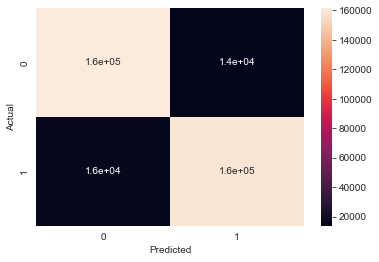

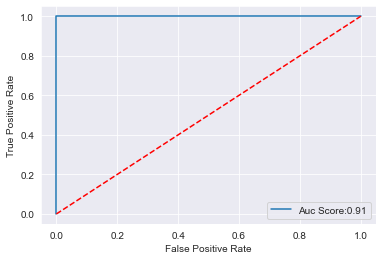

In [86]:
tree_1 = DecisionTreeClassifier()

metrics_table_1a = classification_model_1(tree_1)

In [87]:
metrics_table_1a.index = ['Decision_Tree_1']
metrics_table_1a

,Precision,Recall,f1_Score
Decision_Tree_1,0.926116,0.906339,0.910011


## RANDOM FOREST


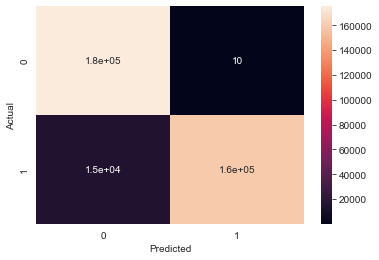

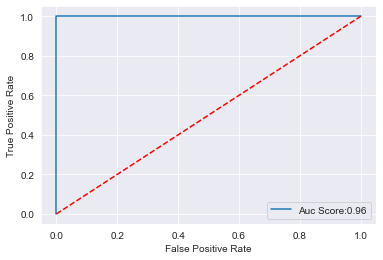

In [89]:
forest_1 = RandomForestClassifier()

metrics_table_1b = classification_model_1(forest_1)

In [90]:
metrics_table_1b.index = ['Random_forest_1']

metrics_table_1b

,Precision,Recall,f1_Score
Random_forest_1,0.99992,0.911383,0.949155


## EXTRA TREES


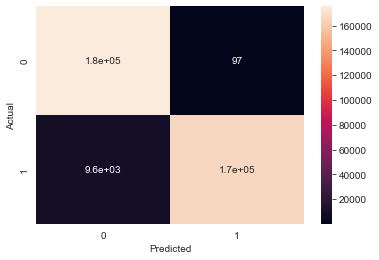

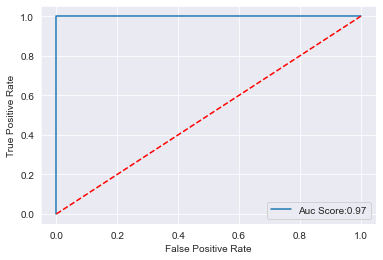

In [45]:
ext_1 = ExtraTreesClassifier()

metrics_table_1c = classification_model_1(ext_1)

In [46]:
metrics_table_1c.index = ['Extra_Trees_1']

metrics_table_1c

,Precision,Recall,f1_Score
Extra_Trees_1,0.999564,0.945069,0.971253


## LOGISTIC REGRESSION


<IPython.core.display.Javascript object>

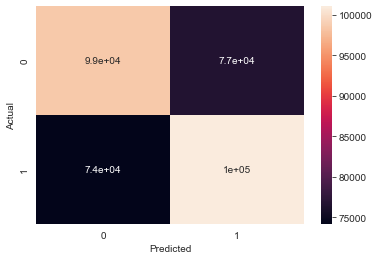

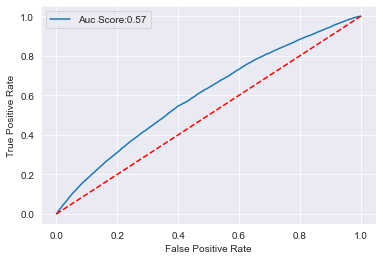

In [93]:
log_1 = LogisticRegression()

metrics_table_1e = classification_model_1(log_1)

In [94]:
metrics_table_1e.index = ['Logistic_Reg_1']

metrics_table_1e

,Precision,Recall,f1_Score
Logistic_Reg_1,0.568825,0.576711,0.572737


## XGBOOST


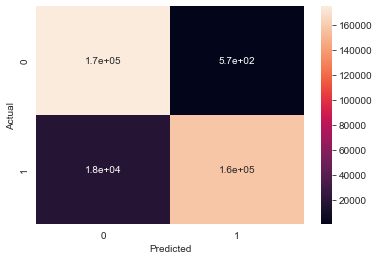

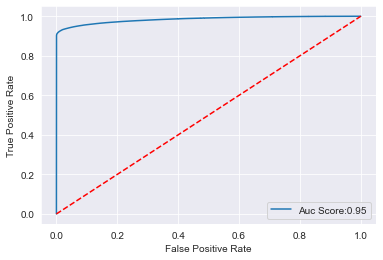

In [95]:
xgb_1 = xgboost.XGBClassifier()

metrics_table_1f = classification_model_1(xgb_1)

In [96]:
metrics_table_1f.index = ['Xgboost_1']

metrics_table_1f

,Precision,Recall,f1_Score
Xgboost_1,0.996751,0.898139,0.939527


In [97]:
metrics_1 = pd.concat([metrics_table_1a,metrics_table_1b,metrics_table_1c,metrics_table_1e,metrics_table_1f])

metrics_1.sort_values(by=['f1_Score'], ascending=[False,])

,Precision,Recall,f1_Score
Extra_Trees_1,0.999511,0.942698,0.968661
Random_forest_1,0.999920,0.911383,0.949155
Xgboost_1,0.996751,0.898139,0.939527
Decision_Tree_1,0.926116,0.906339,0.910011
Logistic_Reg_1,0.568825,0.576711,0.572737


## EXPERIMENT 2
 - NULL VALUES: IMPUTATION
 - TRANSFORMATION: YEO-JOHNSON
 - SCALING: MAX-ABS SCALING
 - ENCODING: ONE HOT ENCODER
 - IMBALANCE: ADASYN

In [31]:
xtrain_2 = xtrain.copy()
ytrain_2 = ytrain.copy()

num = xtrain_2.select_dtypes('number').columns
cat = xtrain_2.select_dtypes('O').columns

In [32]:
# imputation
median_imputer = SimpleImputer(strategy='median')

xtrain_2[num] = median_imputer.fit_transform(xtrain_2[num])

In [33]:
# imputation
mode_imputer = SimpleImputer(strategy='most_frequent')

xtrain_2[cat] = mode_imputer.fit_transform(xtrain_2[cat])

In [34]:
#yeo johnson transformation
transformer = PowerTransformer(method='yeo-johnson')

xtrain_2[num] = transformer.fit_transform(xtrain_2[num])

In [35]:
# scaling
from sklearn.preprocessing import MaxAbsScaler

max_abs_scaler = MaxAbsScaler()

xtrain_2[num] = max_abs_scaler.fit_transform(xtrain_2[num])

In [36]:
# one hot encoding
xtrain_2 = pd.get_dummies(xtrain_2, drop_first=True)

In [39]:
#sampling
from imblearn.over_sampling import ADASYN
adasyn_2 = ADASYN()

In [40]:
xtrain_2_s, ytrain_2_s = adasyn_2.fit_resample(xtrain_2, ytrain_2)

## MODEL BUILDING

In [44]:
def classification_model_2(model):
    precision = cross_val_score(model,xtrain_2_s, ytrain_2_s, cv=3, scoring='precision').mean()
    recall = cross_val_score(model,xtrain_2_s, ytrain_2_s, cv=3, scoring='recall').mean()
    f1_score = cross_val_score(model,xtrain_2_s, ytrain_2_s, cv=3, scoring='f1').mean()
    ypred = cross_val_predict(model,xtrain_2_s, ytrain_2_s,cv=3 )
    
    metrics_table = pd.DataFrame({'Precision':precision,
                                 'Recall':recall,
                                 'f1_Score': f1_score}, index=[0])
    
    #confusion matrix
    sns.heatmap(confusion_matrix(ytrain_2_s,ypred), annot=True)
    plt.xlabel('Predicted');plt.ylabel('Actual');plt.show()
    
    #roc curve
    model.fit(xtrain_2_s, ytrain_2_s)
    auc_score = roc_auc_score(ytrain_2_s, ypred)
    fpr, tpr, thresh = roc_curve(ytrain_2_s, model.predict_proba(xtrain_2_s)[:,1])
    plt.plot(fpr, tpr, label = f'Auc Score:{auc_score}')
    plt.ylabel('True Positive Rate');plt.xlabel('False Positive Rate')
    plt.plot([0,1],[0,1], 'r--');plt.legend();plt.show()
    
    return metrics_table

## DECISION TREE

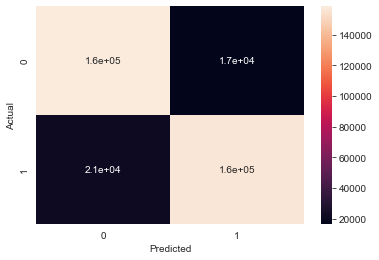

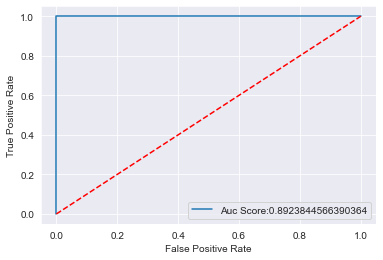

In [45]:
tree_2 = DecisionTreeClassifier()

metrics_table_2a = classification_model_2(tree_2)

In [46]:
metrics_table_2a.index = ['Decision_Tree_2']

metrics_table_2a

,Precision,Recall,f1_Score
Decision_Tree_2,0.905852,0.879884,0.889927


## RANDOM FOREST


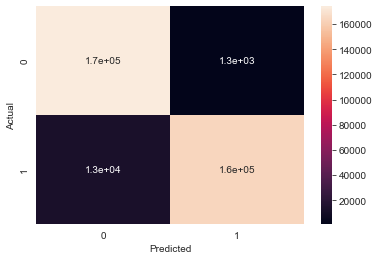

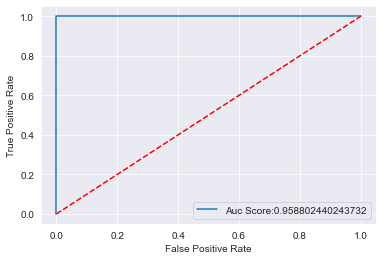

In [47]:
forest_2 = RandomForestClassifier()

metrics_table_2b = classification_model_2(forest_2)

In [48]:
metrics_table_2b.index = ['Random_forest_2']

metrics_table_2b

,Precision,Recall,f1_Score
Random_forest_2,0.9928,0.925416,0.955893


## EXTRA TREES

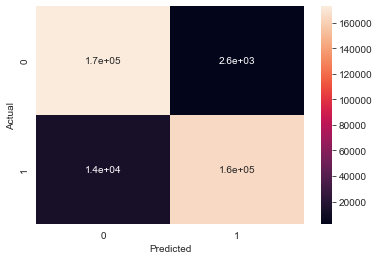

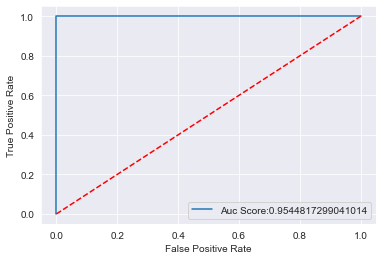

In [49]:
ext_2 = ExtraTreesClassifier()

metrics_table_2c = classification_model_2(ext_2)

In [50]:
metrics_table_2c.index = ['Extra_Trees_2']

metrics_table_2c

,Precision,Recall,f1_Score
Extra_Trees_2,0.984297,0.923155,0.951971


## LOGISTIC REGRESSION


<IPython.core.display.Javascript object>

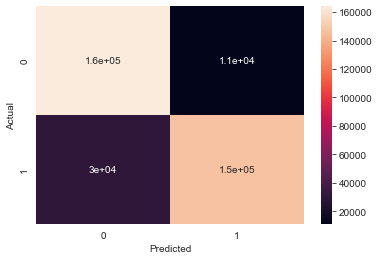

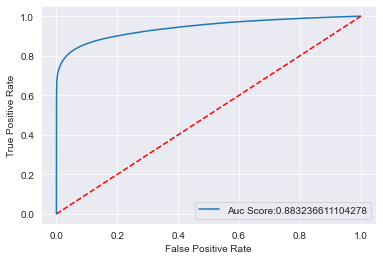

In [51]:
log_2 = LogisticRegression()

metrics_table_2e = classification_model_2(log_2)

In [52]:
metrics_table_2e.index = ['Logistic_Reg_2']

metrics_table_2e

,Precision,Recall,f1_Score
Logistic_Reg_2,0.928858,0.830984,0.873069


## XGBOOST

In [54]:
import xgboost

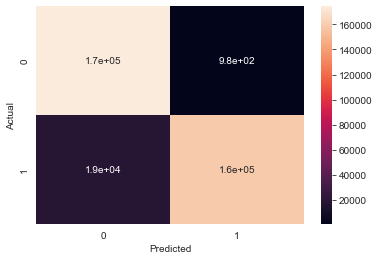

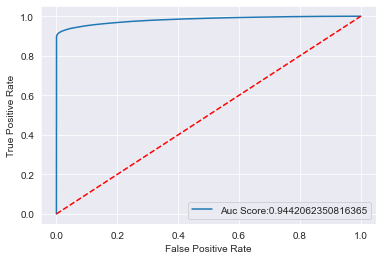

In [55]:
xgb_2 = xgboost.XGBClassifier()

metrics_table_2f = classification_model_2(xgb_2)

In [56]:
metrics_table_2f.index = ['Xgboost_2']

metrics_table_2f

,Precision,Recall,f1_Score
Xgboost_2,0.994465,0.893974,0.935891


In [57]:
metrics_2 = pd.concat([metrics_table_2a,metrics_table_2b,metrics_table_2c,metrics_table_2e,metrics_table_2f])

metrics_2.sort_values(by=['f1_Score'], ascending=[False,])

,Precision,Recall,f1_Score
Random_forest_2,0.992800,0.925416,0.955893
Extra_Trees_2,0.984297,0.923155,0.951971
Xgboost_2,0.994465,0.893974,0.935891
Decision_Tree_2,0.905852,0.879884,0.889927
Logistic_Reg_2,0.928858,0.830984,0.873069


## HYPERPARAMETER TUNING OF BEST MODEL - EXTRA TREES 1

In [47]:
num = xtrain_val.select_dtypes('number').columns
cat = xtrain_val.select_dtypes('O').columns

# imputation
median_imputer = SimpleImputer(strategy='median')

xtrain_val[num] = median_imputer.fit_transform(xtrain_val[num])

# imputation
mode_imputer = SimpleImputer(strategy='most_frequent')

xtrain_val[cat] = mode_imputer.fit_transform(xtrain_val[cat])

# scaling
from sklearn.preprocessing import MaxAbsScaler

max_abs_scaler = MaxAbsScaler()

xtrain_val[num] = max_abs_scaler.fit_transform(xtrain_val[num])

# one hot encoding
xtrain_val = pd.get_dummies(xtrain_val, drop_first=True)

#sampling
from imblearn.over_sampling import ADASYN
adasyn_2 = ADASYN()
xtrain_val_s, ytrain_val_s = adasyn_2.fit_resample(xtrain_val, ytrain_val)

In [54]:
params = {
    'n_estimators':[100,200,500, 700],
    'max_depth':[2,4,6,8],
}

In [61]:
tune = RandomizedSearchCV(ext_1, param_distributions = params, cv=3, scoring='f1').fit(xtrain_val_s, ytrain_val_s)

In [62]:
tune.best_estimator_

ExtraTreesClassifier(max_depth=8, n_estimators=700)

In [63]:
tune.best_params_, tune.best_score_

({'n_estimators': 700, 'max_depth': 8}, 0.764578771596624)

In [58]:
final_model = tune.best_estimator_

## RETRAINING

#### FEATURE ENGINEERING

In [64]:
num = xtrain_full.select_dtypes('number').columns
cat = xtrain_full.select_dtypes('O').columns

# imputation
median_imputer = SimpleImputer(strategy='median')

xtrain_full[num] = median_imputer.fit_transform(xtrain_full[num])

# imputation
mode_imputer = SimpleImputer(strategy='most_frequent')

xtrain_full[cat] = mode_imputer.fit_transform(xtrain_full[cat])

# scaling
from sklearn.preprocessing import MaxAbsScaler

max_abs_scaler = MaxAbsScaler()

xtrain_full[num] = max_abs_scaler.fit_transform(xtrain_full[num])

# one hot encoding
xtrain_full = pd.get_dummies(xtrain_full, drop_first=True)

#sampling
from imblearn.over_sampling import ADASYN
adasyn_2 = ADASYN()
xtrain_full_s, ytrain_full_s = adasyn_2.fit_resample(xtrain_full, ytrain_full)

In [65]:
final_model.fit(xtrain_full_s, ytrain_full_s)

ExtraTreesClassifier(max_depth=8, n_estimators=200)

In [66]:
train_pred = final_model.predict(xtrain_full_s)

<AxesSubplot:>

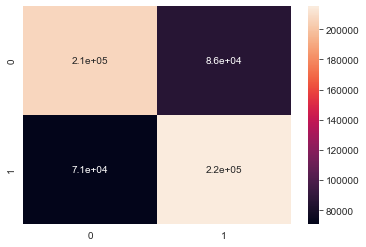

In [67]:
sns.heatmap(confusion_matrix(ytrain_full_s, train_pred), annot=True)

In [68]:
print(classification_report(ytrain_full_s, train_pred))

              precision    recall  f1-score   support

           0       0.74      0.71      0.73    292522
           1       0.72      0.75      0.73    286162

    accuracy                           0.73    578684
   macro avg       0.73      0.73      0.73    578684
weighted avg       0.73      0.73      0.73    578684



## TESTING

In [69]:
num = xtest.select_dtypes('number').columns
cat = xtest.select_dtypes('O').columns

# imputation
median_imputer = SimpleImputer(strategy='median')

xtest[num] = median_imputer.fit_transform(xtest[num])

# imputation
mode_imputer = SimpleImputer(strategy='most_frequent')

xtest[cat] = mode_imputer.fit_transform(xtest[cat])

# scaling
from sklearn.preprocessing import MaxAbsScaler

max_abs_scaler = MaxAbsScaler()

xtest[num] = max_abs_scaler.fit_transform(xtest[num])

# one hot encoding
xtest = pd.get_dummies(xtest, drop_first=True)

#sampling
#from imblearn.over_sampling import ADASYN
#adasyn_2 = ADASYN()3
#xtest_s, ytrain_full_s = adasyn_2.fit_resample(xtest, ytrain_full)

In [70]:
test_pred = final_model.predict(xtest)

In [72]:
roc_auc_score(ytest, test_pred)

0.6056678377850728

In [73]:
print(classification_report(ytest, test_pred))

              precision    recall  f1-score   support

           0       0.94      0.69      0.80     73029
           1       0.14      0.52      0.22      6971

    accuracy                           0.68     80000
   macro avg       0.54      0.61      0.51     80000
weighted avg       0.87      0.68      0.75     80000



Note: Model isn't generalizing well. Improve model performance